## Imports

In [1]:
#Basics
import pandas as pd
import seaborn as sns
import datetime
import numpy as np
import geopandas as gpd
import math

#Plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

#Stats & modeling
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
import statsmodels.api as sm
from sklearn.model_selection import ShuffleSplit
from sklearn.linear_model import LinearRegression
from scipy.stats import ttest_rel
import statsmodels.api as sm
from sklearn.inspection import permutation_importance


## Load in data

In [2]:
#Load in CDD with average temp 
df = pd.read_csv('/Users/charlottecockburn/Documents/Columbia/AC_project/remote_deela/monthly_cdd.csv')
df['Date'] = pd.to_datetime(df['Date'],format='%m/%d/%y')
#Load in ELD
dfeld = pd.read_csv('/Users/charlottecockburn/Documents/Columbia/AC_project/remote_deela/monthly_eld.csv')
dfeld['Date'] = pd.to_datetime(dfeld['Date'],format='%m/%d/%y')
##Load in enthalpy
dfq = pd.read_csv('/Users/charlottecockburn/Documents/Columbia/AC_project/remote_deela/monthly_qdd.csv')
dfq['Date'] = pd.to_datetime(dfq['Date'],format='%m/%d/%y')
#Load in electricity data
dfe = pd.read_csv('/Users/charlottecockburn/Documents/Columbia/AC_project/Data/emberdata.csv')
dfe['Date'] = pd.to_datetime(dfe['Date'],format='%m/%d/%y')
#Merge with CDD based on country and year
mdf = pd.merge(dfe, df, on=['Country', 'Date'])
mdf = pd.merge(mdf, dfeld, on=['Country', 'Date'])
mdf = pd.merge(mdf, dfq, on=['Country', 'Date'])

#Load in AC saturation/ miscellaneous country info 
dfs = pd.read_csv('/Users/charlottecockburn/Documents/Columbia/AC_project/Data/AC_saturation.csv')
# Merge on 'Country'
mdf = mdf.merge(dfs[['Country', 'AC', 'Hemisphere']], on='Country', how='left')
dfi = pd.read_csv('/Users/charlottecockburn/Documents/Columbia/AC_project/data/worldbank_income.csv')
mdf = mdf.merge(dfi[['Country', 'Income group']], on='Country', how='left')
#Load in shapefile for map plotting
shapefile_path = '/Users/charlottecockburn/Documents/Columbia/AC_project/Data/Shapefiles/natural_earth_shapefiles/ne_110m_admin_0_countries.shp'
gdf = gpd.read_file(shapefile_path)


# NOW GDP AND POPULATION 

#Loading GDP and population data from World Bank 
df_gdp = pd.read_csv('/Users/charlottecockburn/Documents/Columbia/AC_project/data/worldbank_gdp.csv', skiprows=4)
year_cols = [col for col in df_gdp.columns if col.isdigit()]
df_gdp_clean = df_gdp[["Country Name"] + year_cols]
df_gdp_long = df_gdp_clean.melt(id_vars="Country Name",value_vars=year_cols,var_name="Year",value_name="GDP")
# Convert Year to int
df_gdp_long["Year"] = df_gdp_long["Year"].astype(int)
#Loading GDP and population data from World Bank 
df_pop = pd.read_csv('/Users/charlottecockburn/Documents/Columbia/AC_project/data/worldbank_population.csv', skiprows=4)
year_cols = [col for col in df_pop.columns if col.isdigit()]
df_pop_clean = df_pop[["Country Name"] + year_cols]
df_pop_long = df_pop_clean.melt(id_vars="Country Name",value_vars=year_cols,var_name="Year",value_name="Population")
# Convert Year to int
df_pop_long["Year"] = df_pop_long["Year"].astype(int)
# Extract year from Date
mdf["Year"] = pd.to_datetime(mdf["Date"]).dt.year
# Merge on Country and Year
mdf = pd.merge(mdf,df_gdp_long,left_on=["Country", "Year"],right_on=["Country Name", "Year"],how="left")
mdf = mdf.drop(columns=["Country Name"])
mdf = pd.merge(mdf,df_pop_long,left_on=["Country", "Year"],right_on=["Country Name", "Year"],how="left")
# Optional: Drop redundant Country Name column
mdf = mdf.drop(columns=["Country Name"])
# INTERPOLATION!!
mdf = mdf.sort_values(['Country', 'Date'])
# Loop through countries
interpolated_parts = []
for country, group in mdf.groupby('Country', sort=False):
    # Copy to avoid modifying the original slice
    g = group.copy()
    # Mask non-January months as NaN
    mask = g['Date'].dt.month != 1
    g.loc[mask, ['GDP', 'Population']] = np.nan
    # Interpolate
    g[['GDP', 'Population']] = g[['GDP', 'Population']].interpolate(method='linear')
    interpolated_parts.append(g)
# Combine back
mdf_interp = pd.concat(interpolated_parts).sort_values(['Country', 'Date'])
mdf = mdf_interp
mdf = mdf[mdf['Country'] != 'Taiwan']
print('all goudaaaa!')

all goudaaaa!


In [3]:
# Make warm-season dataset!
# Canonical warm months
north_warm_months = [6, 7, 8, 9]      # Jun–Sep
south_warm_months = [12, 1, 2, 3]     # Dec–Mar

# Ensure Month column
mdf['Month'] = mdf['Date'].dt.month


dynamic_warm_months = {}

for country, dfc in mdf.groupby('Country'):
    hemisphere = dfc['Hemisphere'].iloc[0]
    canonical = north_warm_months if hemisphere == 'North' else south_warm_months

    # Long-term monthly average temperature for each month
    month_avg_temp = dfc.groupby('Month')['avg_temp'].mean()

    # Months to include: canonical OR >19°C threshold
    include = month_avg_temp.index[
        (month_avg_temp > 19) |
        (month_avg_temp.index.isin(canonical))
    ]

    dynamic_warm_months[country] = set(include)


# -----------------------------------------------------
# Apply warm-season filter to entire dataset
# -----------------------------------------------------
wdf = mdf[
    mdf.apply(lambda row: row['Month'] in dynamic_warm_months[row['Country']], axis=1)
]

/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_22492/4078706001.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mdf['Month'] = mdf['Date'].dt.month


## Setting figure style

In [4]:
mpl.rcParams.update({
    #FONTS:
    "font.family": "Helvetica",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "font.size": 14,
    # FIGURE
    "figure.figsize": (10, 5),
    "figure.dpi": 300,
    "savefig.dpi": 300,
    # AXES
    "axes.titlesize": 18,
    "axes.labelsize": 16,
    "axes.titleweight": "bold",
    "axes.linewidth": 1.2,
    # TICKS
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "xtick.major.width": 1.1,
    "ytick.major.width": 1.1,
    "xtick.major.size": 5,
    "ytick.major.size": 5,
    # LINES
    "lines.linewidth": 2,
    "lines.markersize": 6,
    # LEGEND
    "legend.fontsize": 11,
    "legend.frameon": False,
    # GRIDS
    "grid.alpha": 0.2,
    "grid.linewidth": 1,
})

## Figure 1a

/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_10443/3026880378.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mdf['Year'] = mdf['Date'].dt.year


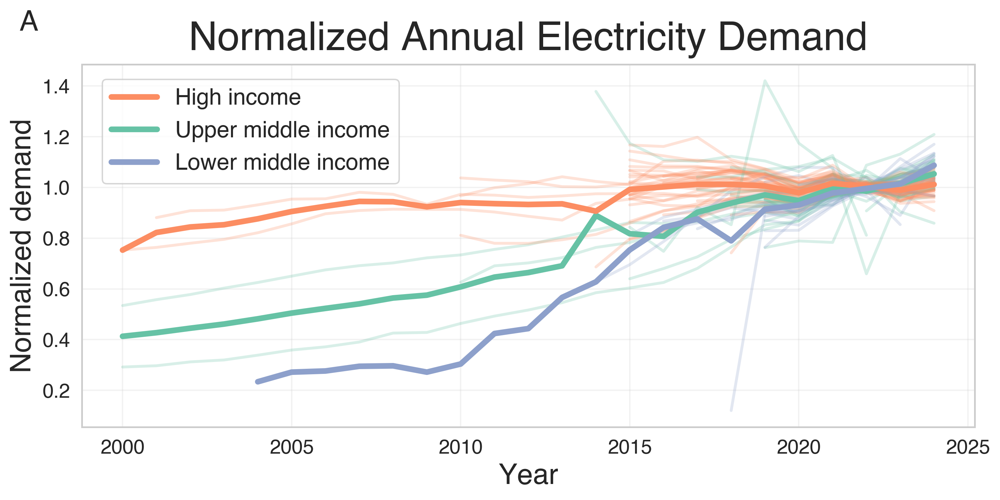

In [70]:
mdf['Year'] = mdf['Date'].dt.year
annual = (mdf.groupby(['Country', 'Income group', 'Year'])['demand_gwh'].mean().reset_index())
baseline = (
    annual[(annual['Year'] >= 2020) & (annual['Year'] <= 2024)]
    .groupby('Country')['demand_gwh']
    .mean()
    .rename('baseline_mean')
)

annual = annual.merge(baseline, on='Country', how='left')

#If a country has no data in 2020–2024, fallback to its overall mean
annual['baseline_mean'] = annual['baseline_mean'].fillna(
    annual.groupby('Country')['demand_gwh'].transform('mean')
)

annual['norm_demand'] = annual['demand_gwh'] / annual['baseline_mean']

group_means = (annual.groupby(['Income group', 'Year'])['norm_demand'].mean().reset_index())

# ---- Figure ---- #
fig, ax = plt.subplots(figsize=(10, 5))

income_groups = annual['Income group'].unique()
palette = sns.color_palette("Set2", n_colors=len(income_groups))  # soft & distinct
income_color_map = dict(zip(income_groups, palette))

for country in annual['Country'].unique():
    cdf = annual[annual['Country'] == country]
    ig = cdf['Income group'].iloc[0]

    ax.plot(
        cdf['Year'],
        cdf['norm_demand'],
        lw=2,
        alpha=0.25,
        color=income_color_map[ig]
    )

for ig in income_groups:
    groupeddf = group_means[group_means['Income group'] == ig]

    ax.plot(
        groupeddf['Year'],
        groupeddf['norm_demand'],
        lw=4,
        alpha=1.0,
        color=income_color_map[ig],
        label=ig
    )


ax.set_title("Normalized Annual Electricity Demand", pad=10, fontsize = 28)
ax.set_xlabel("Year", fontsize = 20)
ax.set_ylabel("Normalized demand", fontsize = 20)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.grid(True, alpha=0.25)

desired_order = ["High income", "Upper middle income", "Lower middle income"]

handles, labels = ax.get_legend_handles_labels()
label_to_handle = dict(zip(labels, handles))

ordered_labels = (
    [ig for ig in desired_order if ig in labels] +
    [ig for ig in labels if ig not in desired_order]
)
ordered_handles = [label_to_handle[ig] for ig in ordered_labels]

ax.legend(
    ordered_handles, ordered_labels,
    loc="upper left",
    bbox_to_anchor=(0.01, 0.99),
    frameon=True,
    framealpha=0.8,
    fontsize=16
)

fig.text(0.03, 0.98, "A", fontsize=20, fontweight='bold', va='top', ha='left')
fig.tight_layout()
plt.savefig("/Users/charlottecockburn/Downloads/demand_over_time.png",
            bbox_inches='tight')
plt.show()


## Figure 1b

In [19]:
# Compute % change per country
df = mdf[mdf['Year'].isin([2020, 2024])]

# Only countries with both years
countries = df.groupby('Country')['Year'].nunique()
df = df[df['Country'].isin(countries[countries == 2].index)]

df_2020 = df[df['Year'] == 2020][['Country', 'demand_kwh_per_capita']]
df_2024 = df[df['Year'] == 2024][['Country', 'demand_kwh_per_capita']]

merged = df_2020.merge(df_2024, on='Country', suffixes=('_2020', '_2024'))

merged['pct_change'] = (
    (merged['demand_kwh_per_capita_2024'] - merged['demand_kwh_per_capita_2020'])
    / merged['demand_kwh_per_capita_2020'] * 100
)

# Merge percent change onto world map
world_pct = gdf.merge(merged[['Country', 'pct_change']], 
                        left_on='ADMIN', right_on='Country', 
                        how='left')

In [100]:
def mapping_stuff(df, var_name, cmap_name, vmin, vmax, extend, title, cbar_label, outname, letter = None, location = [0.1, 0.98], simplify_tolerance = None): 
        
    outpath = "/Users/charlottecockburn/Downloads/" + outname
    figsize = (12, 6.5)
    n_bins = 10                             
    simplify_tolerance = 0.05               
    
    world = df.copy()
    if world.crs is None:
        raise ValueError("world_pct.crs is not set. Please set world_pct.crs to EPSG:4326.")
    if world.crs.to_string() != "EPSG:4326":
        world = world.to_crs(epsg=4326)

    if simplify_tolerance is not None:
        world["geometry"] = world["geometry"].apply(lambda g: g.simplify(simplify_tolerance) if g is not None else g)
    
    world_with = world.dropna(subset=[var_name])
    world_no = world[world[var_name].isna()]
    
    if world_with.empty:
        raise ValueError("No rows with pct_change values found (all NaN).")
    
    # Create discrete colormap and norm (boxes)
    bounds = np.linspace(vmin, vmax, n_bins + 1)
    n_colors = len(bounds) - 1
    cmap = mpl.colormaps[cmap_name].resampled(n_colors)
    norm = mpl.colors.BoundaryNorm(bounds, ncolors=n_colors, clip=True)
    
    # Figure and Robinson axis
    fig = plt.figure(figsize=figsize)
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()
    
    ax.add_feature(cfeature.OCEAN, facecolor="#f5f5f5", zorder=0)
    ax.coastlines(linewidth=0.4, zorder=4)

    if not world_no.empty:
        world_no.plot(ax=ax,
                      facecolor="#e8e8e8",
                      edgecolor="white",
                      linewidth=0.3,
                      zorder=1,
                      transform=ccrs.PlateCarree())
    
    world_with.plot(column=var_name,
                    cmap=cmap,
                    norm=norm,
                    ax=ax,
                    linewidth=0.3,
                    edgecolor="white",
                    zorder=2,
                    transform=ccrs.PlateCarree())

    ax.axis("off")
    
    #colorbar (use the same cmap & norm)
    sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
    # Use the values clipped into the [vmin, vmax] range so colorbar ticks align well
    sm.set_array(np.clip(world_with[var_name].values, vmin, vmax))
    
    plt.subplots_adjust(bottom=0.16)
    cbar_ax = fig.add_axes([0.18, 0.055, 0.64, 0.05])   # [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation="horizontal",
                        boundaries=bounds, ticks=bounds, spacing="proportional", extend = extend)
    cbar.ax.tick_params(labelsize=12, pad=6)
    cbar.set_label(cbar_label, fontsize=16, labelpad=6)
    cbar_ax.set_facecolor("white")
    
    # Title and save
    fig.suptitle(title, fontsize=22, y=0.96)
    fig.text(location[0], location[1], letter, fontsize=20, va='top', ha='left')
    plt.savefig(outpath, dpi=300, bbox_inches="tight")
    plt.show()

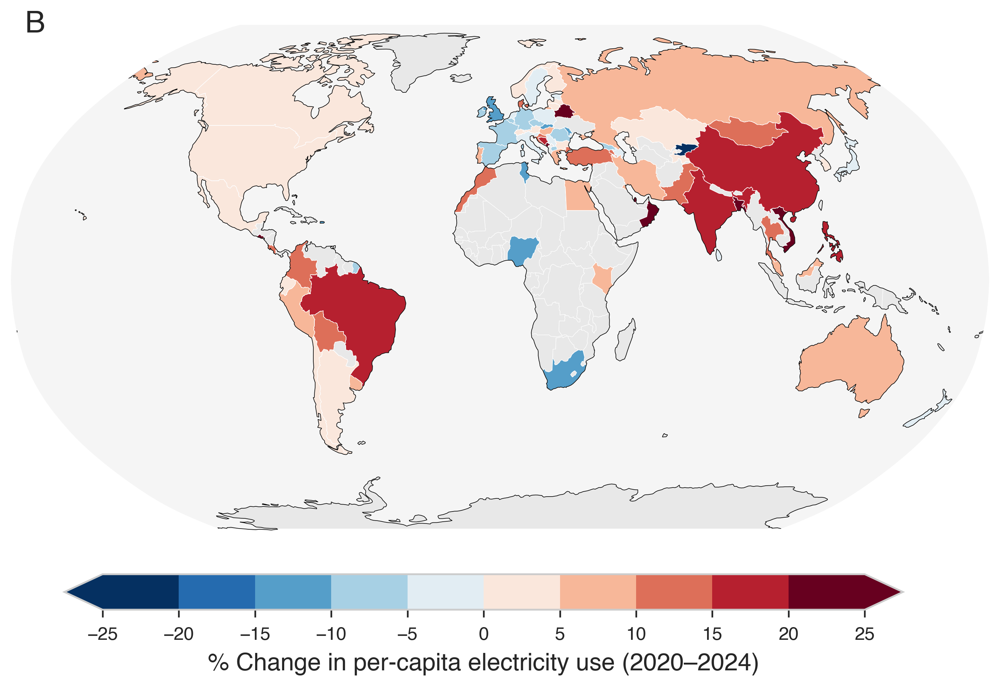

In [72]:
mapping_stuff(world_pct, 'pct_change', 'RdBu_r', -25, 25, 'both', '', 
              '% Change in per-capita electricity use (2020–2024)', 'electricity_change_map.png', 
              letter = 'B', location = [0.15, 0.9], simplify_tolerance = 0.05)

## Figure 3

In [25]:
def plotting_balancetemps(country_name, letter):
    df = mdf[mdf['Country'] == country_name].copy()
    x = df['avg_temp'].values.reshape(-1, 1)
    y = df['demand_gwh'].values

    # ---- Heating threshold search ----
    Tb_heat_candidates = np.linspace(5, 15, 21)
    best_r2_heat, best_Tb_heat, best_model_heat = -np.inf, None, None
    
    for tbh in Tb_heat_candidates:
        mask = x.flatten() <= tbh
        x_sub, y_sub = x[mask], y[mask]
        if len(x_sub) < 2:
            continue
        model = LinearRegression().fit(x_sub, y_sub)
        r2 = r2_score(y_sub, model.predict(x_sub))
        if r2 > best_r2_heat:
            best_r2_heat, best_Tb_heat, best_model_heat = r2, tbh, model

    # ---- Cooling threshold search ----
    Tb_cool_candidates = np.linspace(16, 26, 21)
    best_r2_cool, best_Tb_cool, best_model_cool = -np.inf, None, None
    
    for tbc in Tb_cool_candidates:
        mask = x.flatten() >= tbc
        x_sub, y_sub = x[mask], y[mask]
        if len(x_sub) < 2:
            continue
        model = LinearRegression().fit(x_sub, y_sub)
        r2 = r2_score(y_sub, model.predict(x_sub))
        if r2 > best_r2_cool:
            best_r2_cool, best_Tb_cool, best_model_cool = r2, tbc, model

    # ---- Plot figure ----
    fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

    # Force identical scaling so spacing doesn't wiggle
    ax.set_xlim(df['avg_temp'].min(), df['avg_temp'].max())
    ax.set_ylim(df['demand_gwh'].min(), df['demand_gwh'].max())

    ax.scatter(x, y, color="lightgray", alpha=0.6, label="Observed demand")

    # Heating line
    if best_Tb_heat:
        x_heat = np.linspace(min(x), best_Tb_heat, 100).reshape(-1, 1)
        y_heat = best_model_heat.predict(x_heat)
        ax.plot(x_heat, y_heat, color='red', linewidth=2)
        ax.axvline(best_Tb_heat, color='red', linestyle='--', linewidth=2, alpha=0.8)

    # Cooling line
    if best_Tb_cool:
        x_cool = np.linspace(best_Tb_cool, max(x), 100).reshape(-1, 1)
        y_cool = best_model_cool.predict(x_cool)
        ax.plot(x_cool, y_cool, color='blue', linewidth=2)
        ax.axvline(best_Tb_cool, color='blue', linestyle='--', linewidth=2, alpha=0.8)

    ax.set_xlabel("Monthly average temperature [°C]", fontsize=26, labelpad=10)
    ax.set_ylabel("Electricity demand [GWh]", fontsize=26, labelpad=10)
    ax.set_title(country_name, fontsize=28, pad=15)
    if (country_name == 'Qatar'): ax.set_xlim([15.5, df['avg_temp'].max()])

    ax.grid(True)

    # ---- LEGEND (custom handles so dashed lines appear dashed) ----
    if (best_Tb_cool and best_Tb_heat):
        legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand"),
            Line2D([], [], color='red', linestyle='--', linewidth=2,label=f"Heating threshold ({best_Tb_heat:.1f}°C)"),
            Line2D([], [], color='blue', linestyle='--', linewidth=2,label=f"Cooling threshold ({best_Tb_cool:.1f}°C)")
        ]
    elif best_Tb_cool: 
        legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand"),
            Line2D([], [], color='blue', linestyle='--', linewidth=2,label=f"Cooling threshold ({best_Tb_cool:.1f}°C)")
        ]
    elif best_Tb_heat: 
        legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand"),
            Line2D([], [], color='red', linestyle='--', linewidth=2,label=f"Heating threshold ({best_Tb_heat:.1f}°C)"),
        ]
    else:
        legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand"),
        ]
        
        
    ax.legend(handles=legend_handles, fontsize=14)
    fig.text(0.03, 0.99, letter, fontsize=20, fontweight='bold', va='top', ha='left')

    fig.savefig(f"/Users/charlottecockburn/Downloads/{country_name}_balancetemps.png",
                bbox_inches="tight")
    plt.show()


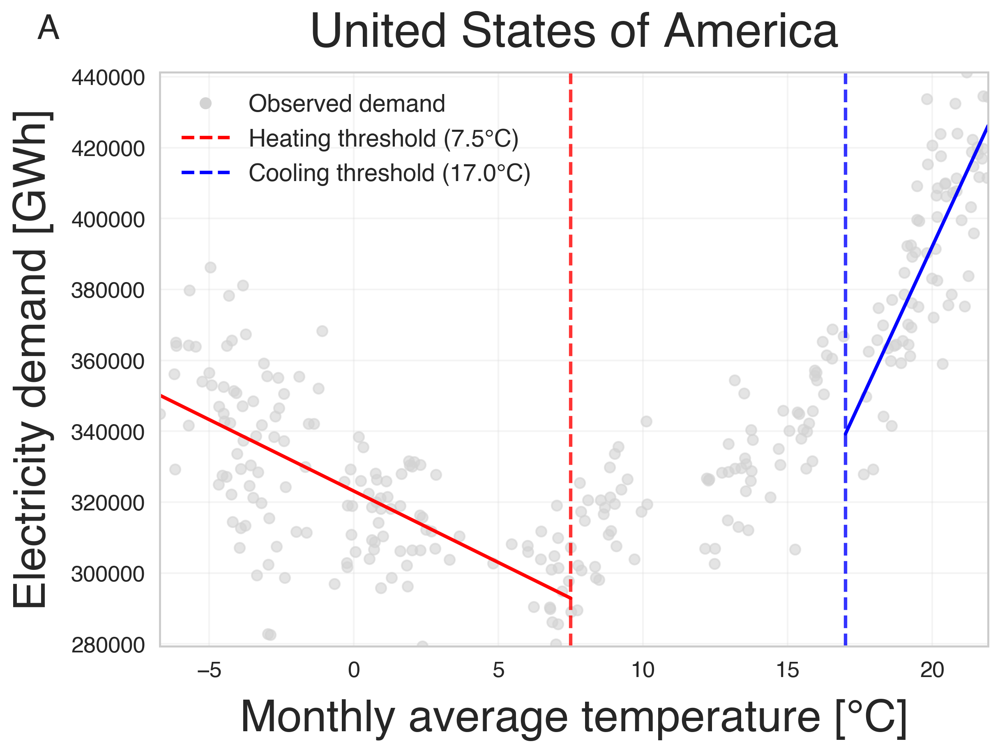

In [80]:
plotting_balancetemps('United States of America', 'A')

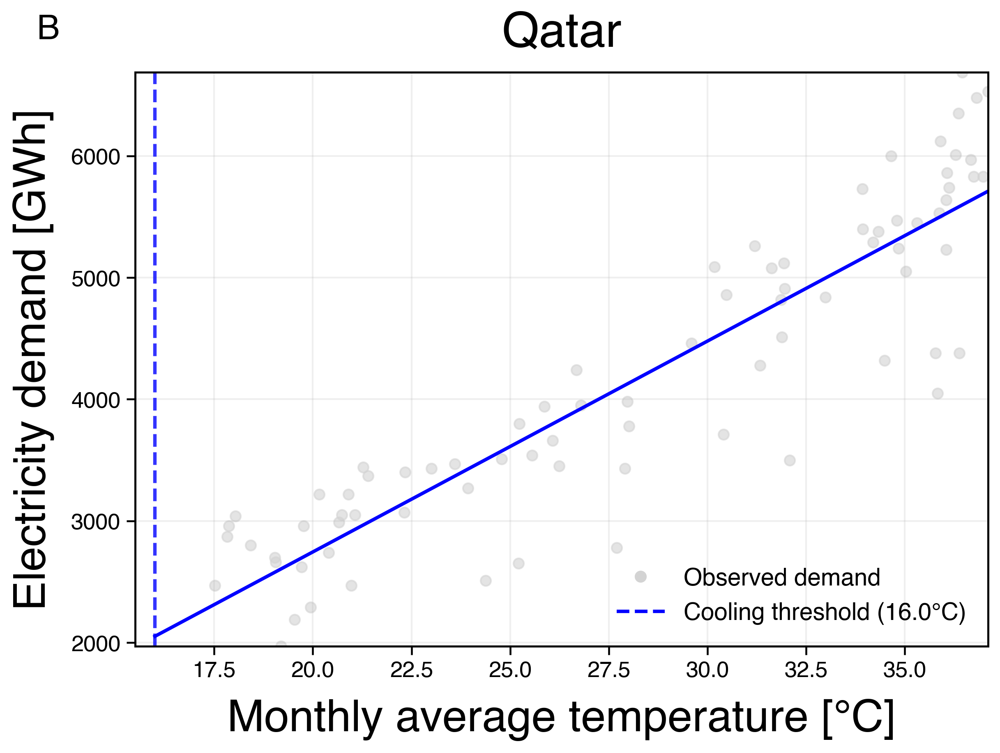

In [26]:
plotting_balancetemps('Qatar', 'B')

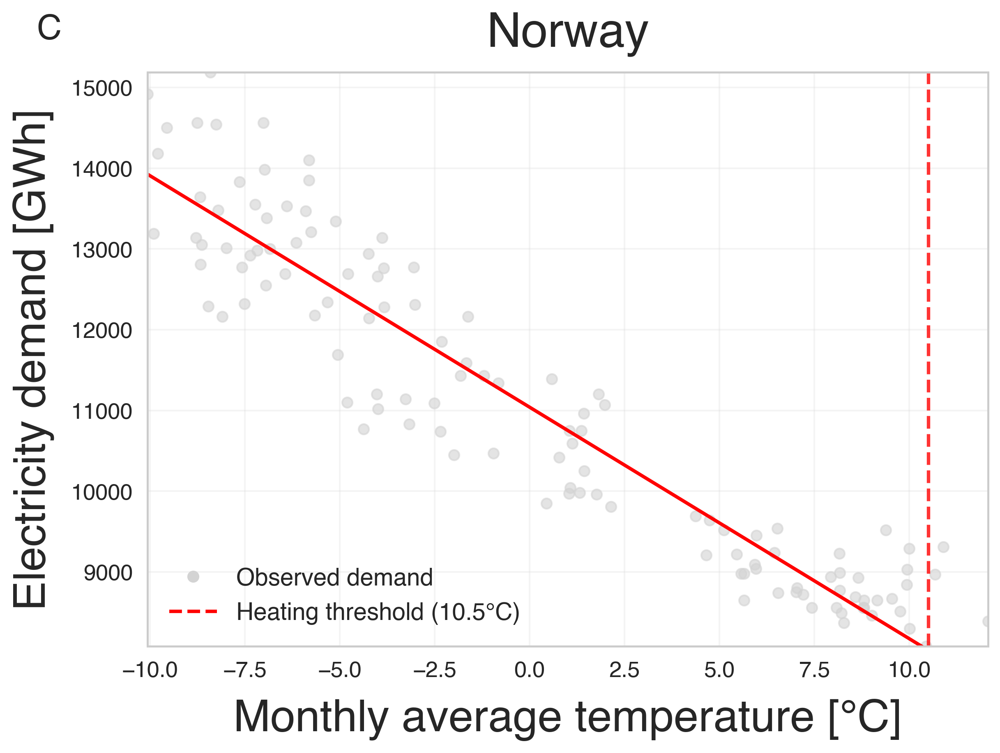

In [83]:
plotting_balancetemps('Norway', 'C')

In [35]:
# Get list of unique countries
countries = mdf['Country'].unique()
# Store results
results = []

# Loop over countries
for i, country in enumerate(countries):    
    country_df = mdf[mdf['Country'] == country].copy()
    x = country_df['avg_temp'].values.reshape(-1,1)
    y = country_df['demand_gwh'].values
    # Heating base
    Tb_heat_candidates = np.linspace(5, 16, 21)
    best_r2_heat = -np.inf
    best_Tb_heat = None
    best_model_heat = None
    for tbh in Tb_heat_candidates:
        mask = x.flatten() <= tbh
        x_sub = x[mask]
        y_sub = y[mask]
        if len(x_sub) < 10:
            continue
        model = LinearRegression().fit(x_sub, y_sub)
        r2 = r2_score(y_sub, model.predict(x_sub))
        if r2 > best_r2_heat:
            best_r2_heat = r2
            best_Tb_heat = tbh
            best_model_heat = model
    # Cooling base
    Tb_cool_candidates = np.linspace(16, 26, 21)
    best_r2_cool = -np.inf
    best_Tb_cool = None
    best_model_cool = None
    for tbc in Tb_cool_candidates:
        mask = x.flatten() >= tbc
        x_sub = x[mask]
        y_sub = y[mask]
        if len(x_sub) < 10:
            continue
        model = LinearRegression().fit(x_sub, y_sub)
        r2 = r2_score(y_sub, model.predict(x_sub))
        if r2 > best_r2_cool:
            best_r2_cool = r2
            best_Tb_cool = tbc
            best_model_cool = model
    
    # Store results
    results.append({'Country': country, 'Tb_heat': best_Tb_heat, 'Tb_cool': best_Tb_cool})
# Convert results to DataFrame
results_df = pd.DataFrame(results)
results_df.to_csv('/Users/charlottecockburn/Downloads/balance_temps.csv')

## Figure 2d

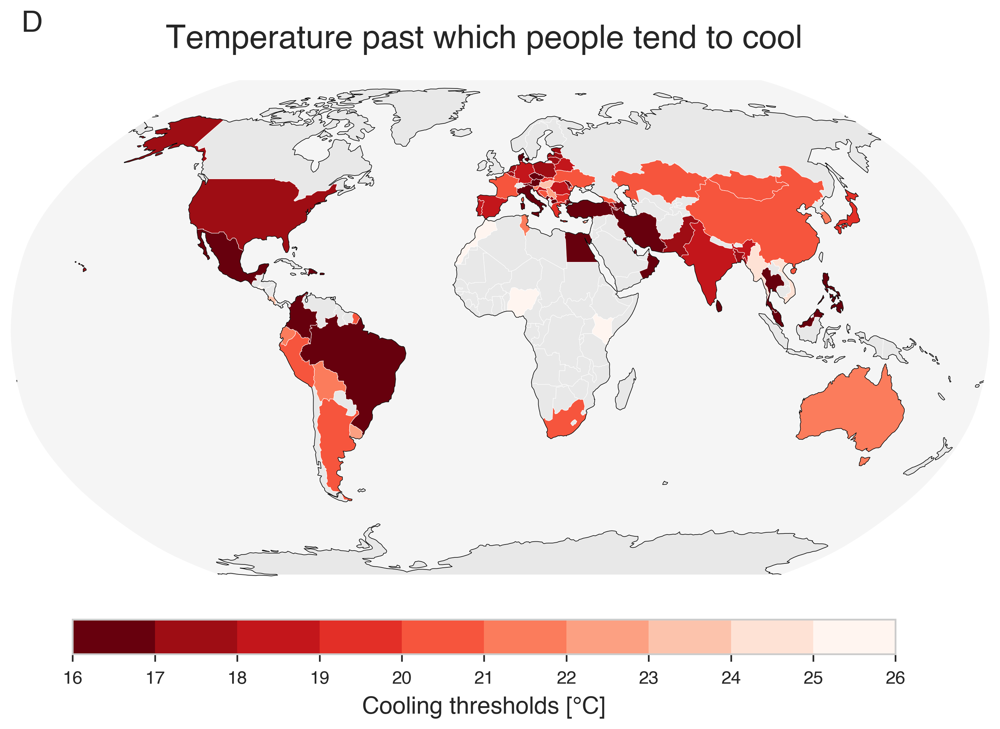

In [84]:
gdf = gpd.read_file(shapefile_path)

tb_map = gdf.merge(results_df[['Country', 'Tb_cool']], 
                        left_on='ADMIN', right_on='Country', 
                        how='left')

mapping_stuff(tb_map, 'Tb_cool', 'Reds_r', 16, 26, 'neither', 'Temperature past which people tend to cool', 
              'Cooling thresholds [°C]', 'tb_map.png', letter = 'D', location =[0.14, 0.98])

## Figure 3

In [48]:
def adjusted_r2(r2, n, p):
    if n == p + 1:
        return -np.inf  # Avoid division by zero or overfitting when n ~ p+1
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

def fit_poly_with_adj_r2(x, y, max_degree=3):
    n = len(x)
    best_adj_r2 = -np.inf
    best_model = None
    best_degree = None
    
    max_degree = min(max_degree, n - 2)
    
    for degree in range(1, max_degree + 1):
        model = make_pipeline(StandardScaler(), PolynomialFeatures(degree), LinearRegression())
        model.fit(x.reshape(-1, 1), y)
        r2 = model.score(x.reshape(-1, 1), y)
        adj_r2 = adjusted_r2(r2, n, degree)
        
        if adj_r2 > best_adj_r2:
            best_adj_r2 = adj_r2
            best_model = model
            best_degree = degree
            
    if best_model is None:
        return None
    
    return {
        'model': best_model,
        'degree': best_degree,
        'adj_r2': best_adj_r2,
    }


In [49]:
# Get linear r2 for each country!
warm_season_north = [6, 7, 8, 9]
warm_season_south = [12, 1, 2, 3]
results = []
countries = mdf['Country'].unique()
n_countries = len(countries)
for i, country in enumerate(countries):    
    dfc = mdf[mdf['Country'] == country].dropna(subset=['cdd_sum_sum', 'demand_gwh', 'avg_temp'])
    if dfc.empty or dfc['Hemisphere'].isna().all():
        continue
    gdp_capita = np.mean(dfc['GDP'] / dfc['Population'])
    gdp = np.mean(dfc['GDP'])
    pop = np.mean(dfc['Population'])
    hemisphere = dfc['Hemisphere'].iloc[0]
    warm_months = warm_season_north if hemisphere == 'North' else warm_season_south
    # --- Compute long-term monthly average temperatures ---
    dfc['Month'] = dfc['Date'].dt.month
    month_avg_temp = dfc.groupby('Month')['avg_temp'].mean()
    # Include months that are in warm season OR have average temp > 19°C
    include_months = month_avg_temp.index[(month_avg_temp > 19) | (month_avg_temp.index.isin(warm_months))]
    dfc = dfc[dfc['Month'].isin(include_months)]
    if len(dfc) < 5:
        continue
    X = dfc['cdd_sum_sum'].values.reshape(-1, 1)
    y = dfc['demand_gwh'].values
    # Fit polynomial model
    fit = fit_poly_with_adj_r2(X, y, max_degree=1)
    if fit is None:
        continue
    row = dfs[dfs['Country'] == country]
    if row.empty:
        continue
    ac = row['AC'].values[0]
    avg_temp = dfc['avg_temp'].mean()
    results.append({
        'Country': country,
        'BestDegree': fit['degree'],
        'BestR2': fit['adj_r2'],
        'AC': ac,
        'avg_temp': avg_temp,
        'avg_gdp': gdp, 
        'avg_pop': pop,
        'gdp_capita': gdp_capita
    })
    sat = dfc['AC'].iloc[0]
# Convert results to DataFrame
df_all = pd.DataFrame(results)

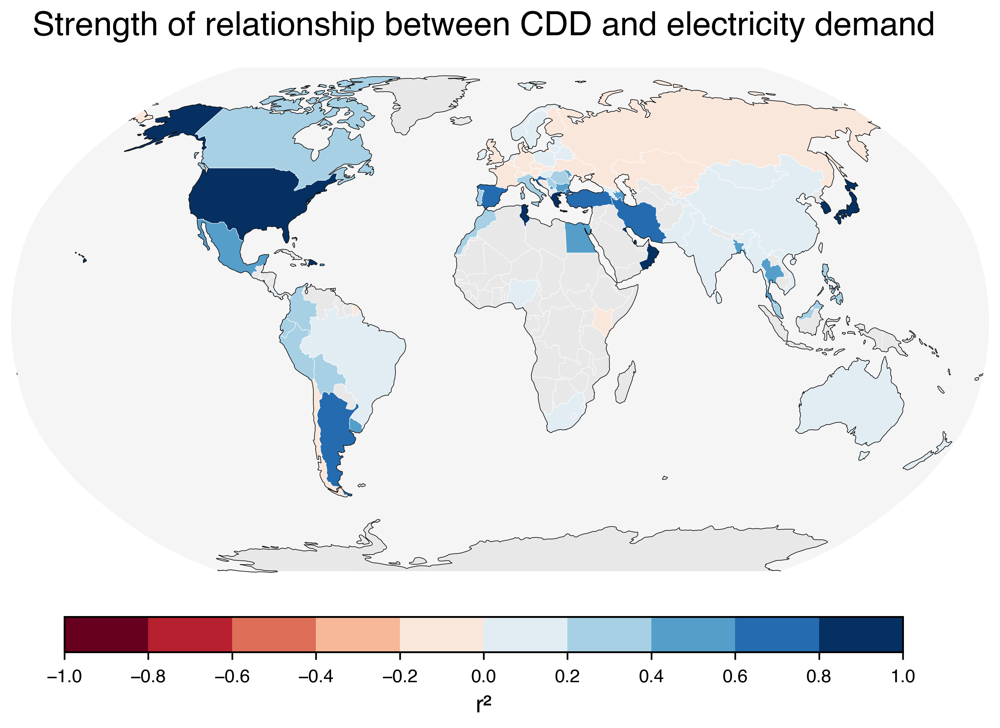

In [50]:
gdf = gpd.read_file(shapefile_path)

r2_map = gdf.merge(df_all[['Country', 'BestR2']], 
                        left_on='ADMIN', right_on='Country', 
                        how='left')

mapping_stuff(r2_map, 'BestR2', 'RdBu', -1, 1, 'neither', 'Strength of relationship between CDD and electricity demand', 
              'r²', 'r2_map.png')

## Figure 4

/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_10443/3589612300.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  slope = model.params[1]        # coefficient on x
/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_10443/3589612300.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  slope = model.params[1]        # coefficient on x


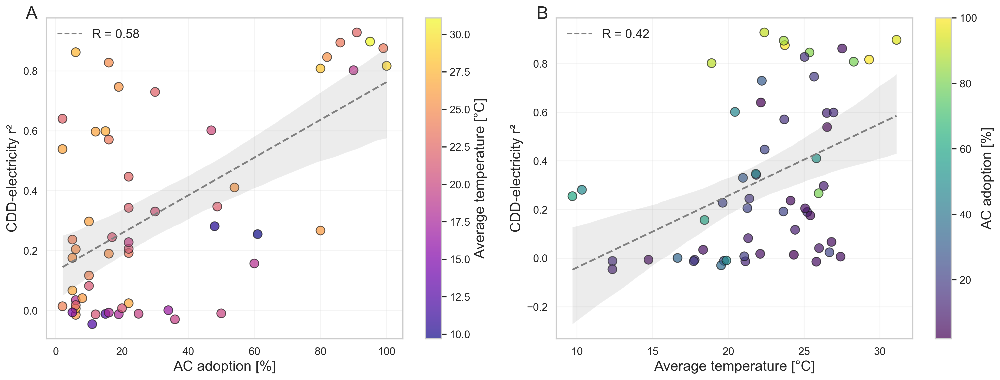

In [86]:
# FINAL TAKE: omit GDP, and change to R instead of R2: 

sns.set(style="whitegrid")  # consistent style

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes = axes.flatten()  # easier indexing

def scatter_with_fit(ax, x, y, xlabel, ylabel=None, subset=None, color_by=None, cmap_name='viridis', letter = None, location = [0.01, 0.99]):
    """Scatter + OLS fit line + legend with R² (subset optional, optional color gradient)."""
    if subset is not None:
        if color_by:
            df = subset[[x, y, color_by]].dropna()
        else:
            df = subset[[x, y]].dropna()
    else:
        if color_by:
            df = df_all[[x, y, color_by]].dropna()
        else:
            df = df_all[[x, y]].dropna()

    if df.empty:
        print(f"No data for {xlabel} vs {ylabel}")
        return

    X = sm.add_constant(df[x])
    model = sm.OLS(df[y], X).fit()
    r2 = model.rsquared
    slope = model.params[1]        # coefficient on x
    r = np.sign(slope) * np.sqrt(r2)

    # Scatter with gradient color if color_by is provided
    if color_by:
        sc = ax.scatter(
            df[x], df[y],
            c=df[color_by],
            cmap=cmap_name,
            s=100,
            edgecolor='k',
            alpha=0.7
        )
        cbar = plt.colorbar(sc, ax=ax)
        if(color_by == 'avg_temp'):
            cbar.set_label('Average temperature [°C]', fontsize=16)
        elif(color_by == 'AC'):
            cbar.set_label('AC adoption [%]', fontsize=16)

        cbar.ax.tick_params(labelsize=12)
    else:
        sc = ax.scatter(
            df[x], df[y],
            color='steelblue',
            s=100,
            edgecolor='k',
            alpha=0.7
        )

    # Dashed fit line
    sns.regplot(
        data=df, x=x, y=y,
        scatter=False, ax=ax,
        color='gray',
        line_kws={'linestyle': 'dashed', 'linewidth': 2}
    )

    # Legend with r
    legend_text = f"R = {r:.2f}"
    legend_handles = [Line2D([], [], color='gray', linestyle='--', label=legend_text)]
    ax.legend(handles=legend_handles, fontsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    if ylabel:
        ax.set_ylabel(ylabel, fontsize=16)
    ax.tick_params(labelsize=12)
    fig.text(location[0], location[1], letter, fontsize=20, va='top', ha='left')

# --- Plot 1: AC adoption colored by temperature ---
df_ac = df_all.merge(dfs[['Country','Notes']], on='Country')
df_ac = df_ac[df_ac['Notes'] != 'Dubious']
scatter_with_fit(
    axes[0], x='AC', y='BestR2',
    xlabel='AC adoption [%]',
    ylabel='CDD-electricity r²',
    subset=df_ac,
    color_by='avg_temp',
    cmap_name='plasma',
    letter = 'A', 
    location = [0.03, 0.99]
)

# --- Plot 2: Avg temperature colored by AC adoption ---
scatter_with_fit(
    axes[1], x='avg_temp', y='BestR2',
    xlabel='Average temperature [°C]',
    ylabel='CDD-electricity r²',
    subset=df_ac,
    color_by='AC',
    cmap_name='viridis',
    letter = 'B', 
    location = [0.53, 0.99]
)


plt.tight_layout()
plt.savefig('/Users/charlottecockburn/Downloads/r2_all_2x1.png', dpi=300)
plt.show()


/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_10443/3589612300.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  slope = model.params[1]        # coefficient on x
/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_10443/3589612300.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  slope = model.params[1]        # coefficient on x


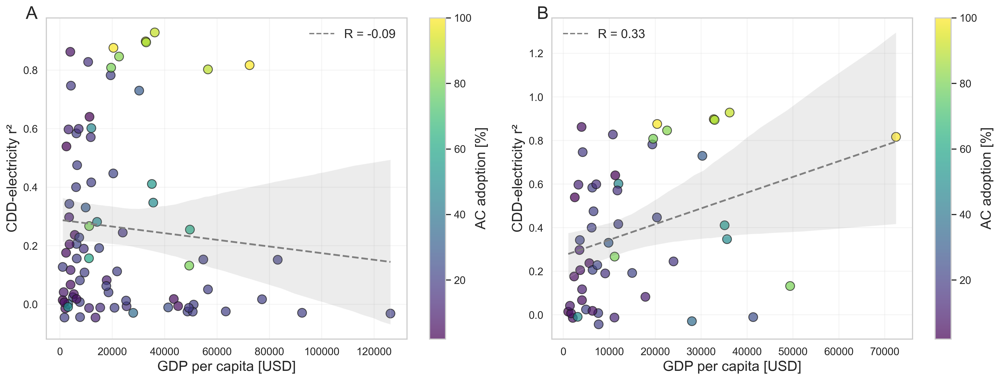

In [89]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes = axes.flatten()  # easier indexing

# --- Plot 3: GDP per capita ---
df_gdp = df_all[['gdp_capita', 'BestR2', 'AC']].dropna()
scatter_with_fit(
    axes[0], x='gdp_capita', y='BestR2',
    xlabel='GDP per capita [USD]',
    ylabel='CDD-electricity r²',
    subset=df_gdp,
    color_by='AC',
    cmap_name='viridis',
    letter = 'A', 
    location = [0.03, 0.99]
)

# --- Plot 4: GDP per capita in hot countries ---
df_hot_gdp = df_all[['gdp_capita', 'avg_temp', 'BestR2', 'AC']].dropna()
df_hot_gdp = df_hot_gdp[df_hot_gdp['avg_temp'] > 19]
scatter_with_fit(
    axes[1], x='gdp_capita', y='BestR2',
    xlabel='GDP per capita [USD]',
    ylabel='CDD-electricity r²',
    subset=df_hot_gdp,
    color_by='AC',
    cmap_name='viridis',
    letter = 'B', 
    location = [0.53, 0.99]
)

plt.tight_layout()
plt.savefig('/Users/charlottecockburn/Downloads/r2_all_1x2_GDP.png', dpi=300)
plt.show()


## Figure 5

In [90]:
# Canonical warm months
north_warm_months = [6, 7, 8, 9]      # Jun–Sep
south_warm_months = [12, 1, 2, 3]     # Dec–Mar
mdf['Month'] = mdf['Date'].dt.month

dynamic_warm_months = {}

for country, dfc in mdf.groupby('Country'):
    hemisphere = dfc['Hemisphere'].iloc[0]
    canonical = north_warm_months if hemisphere == 'North' else south_warm_months

    # Long-term monthly average temperature for each month
    month_avg_temp = dfc.groupby('Month')['avg_temp'].mean()

    # Months to include: canonical OR >19°C threshold
    include = month_avg_temp.index[
        (month_avg_temp > 19) |
        (month_avg_temp.index.isin(canonical))
    ]

    dynamic_warm_months[country] = set(include)

wdf = mdf[mdf.apply(lambda row: row['Month'] in dynamic_warm_months[row['Country']], axis=1)]


/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_10443/486609775.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mdf['Month'] = mdf['Date'].dt.month


In [5]:
features = ['cdd_sum_sum', 'Population', 'GDP', 'avg_ELD']
target = 'demand_gwh'

countries = [c for c, df_c in wdf.groupby('Country') if len(df_c.dropna(subset=features+[target])) >= 5]

results = []

n_splits = 100  # number of Monte Carlo resamples

train_sizes = []

for country_name in countries:
    df = wdf[wdf['Country']==country_name][features+[target]].dropna()
    X = df[features].values
    y = df[target].values
    
    if len(y) < 2:
        print(f"Skipping {country_name}, not enough samples")
        continue

    ss = ShuffleSplit(n_splits=n_splits, test_size=0.2, random_state=42)
    
    r2_list = []
    rmse_ratio_list = []

    for train_idx, test_idx in ss.split(X):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        train_size = len(y_train)
        
        if len(y_test) < 2:
            continue  # skip tiny test sets
        
        model = LinearRegression()
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        # Compute metrics
        r2 = r2_score(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        rmse_ratio = rmse / np.mean(y_test) if np.mean(y_test) != 0 else np.nan
        
        r2_list.append(r2)
        rmse_ratio_list.append(rmse_ratio)

    train_sizes.append(train_size)
    
    if len(r2_list) == 0:
        continue
    
    results.append({
        'Country': country_name,
        'avg_R2': np.mean(r2_list),
        'avg_RMSE_ratio': np.mean(rmse_ratio_list)
    })

# Convert to DataFrame
country_metrics = pd.DataFrame(results)

# Optional: sort by avg_R2
country_metrics = country_metrics.sort_values('avg_R2', ascending=False)

In [10]:
print('Number of countries above 0.6:',len(country_metrics[country_metrics['avg_R2']>0.6]))

Number of countries above 0.6: 36


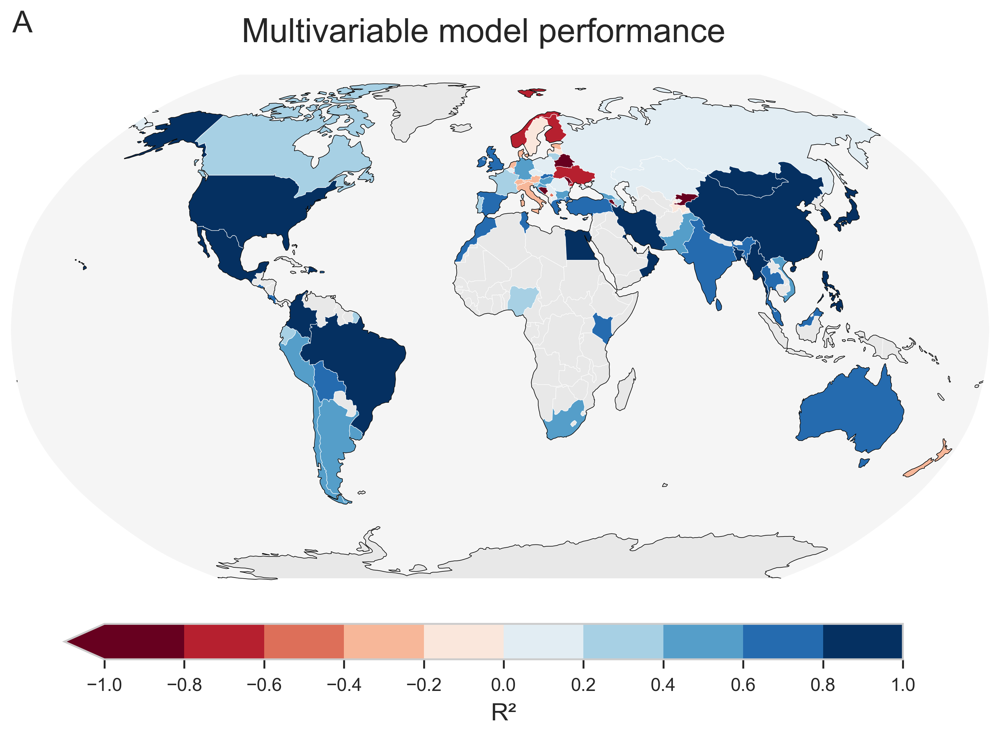

In [103]:
# GENERIC MAPPING FUNCTION
gdf = gpd.read_file(shapefile_path)

R2_map = gdf.merge(country_metrics[['Country', 'avg_R2']], 
                        left_on='ADMIN', right_on='Country', 
                        how='left')

mapping_stuff(R2_map, 'avg_R2', 'RdBu', -1, 1, 'min', 'Multivariable model performance', 
              'R²', 'R2_map.png', letter = 'A', location = [0.14, 0.97])

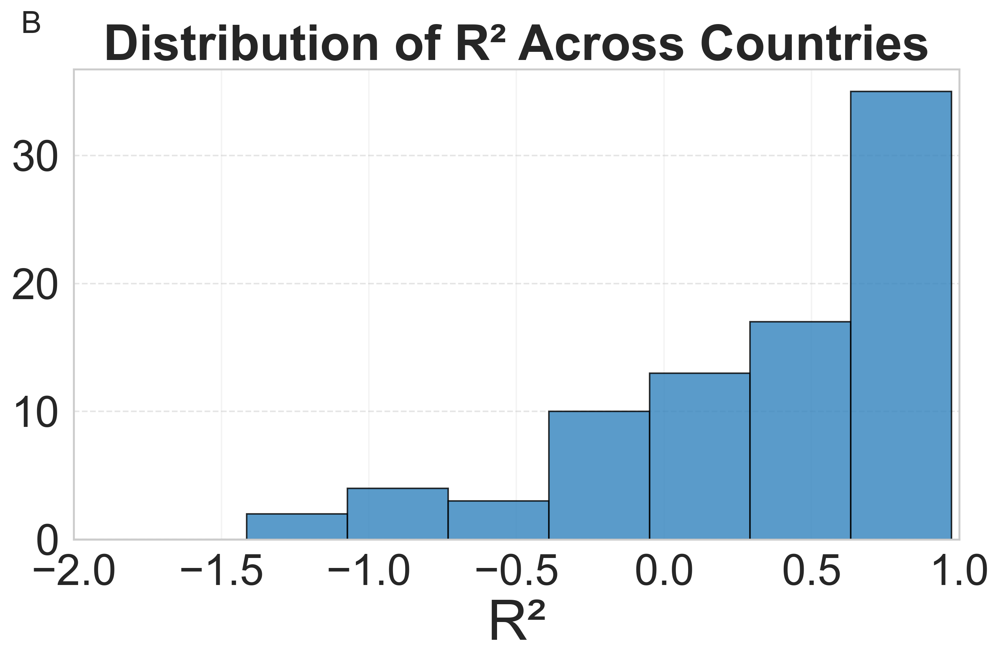

In [106]:
# Histogram of R²
fig = plt.figure(figsize=(9,6))
plt.hist(country_metrics["avg_R2"], bins=10, color="#3182bd", edgecolor="black", alpha=0.8)
plt.xlabel("R²", fontsize=36)
#plt.ylabel("Number of countries", fontsize=36)
plt.title("Distribution of R² Across Countries", fontsize=32, fontweight="bold")
# Grid and tick labels
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tick_params(axis='both', which='major', labelsize=28)
fig.text(0.03, 0.99, 'B', fontsize=20, va='top', ha='left')

plt.xlim(-2, 1)  # zoom in on realistic R² values
plt.tight_layout()
plt.savefig('/Users/charlottecockburn/Downloads/R2_dist.png')

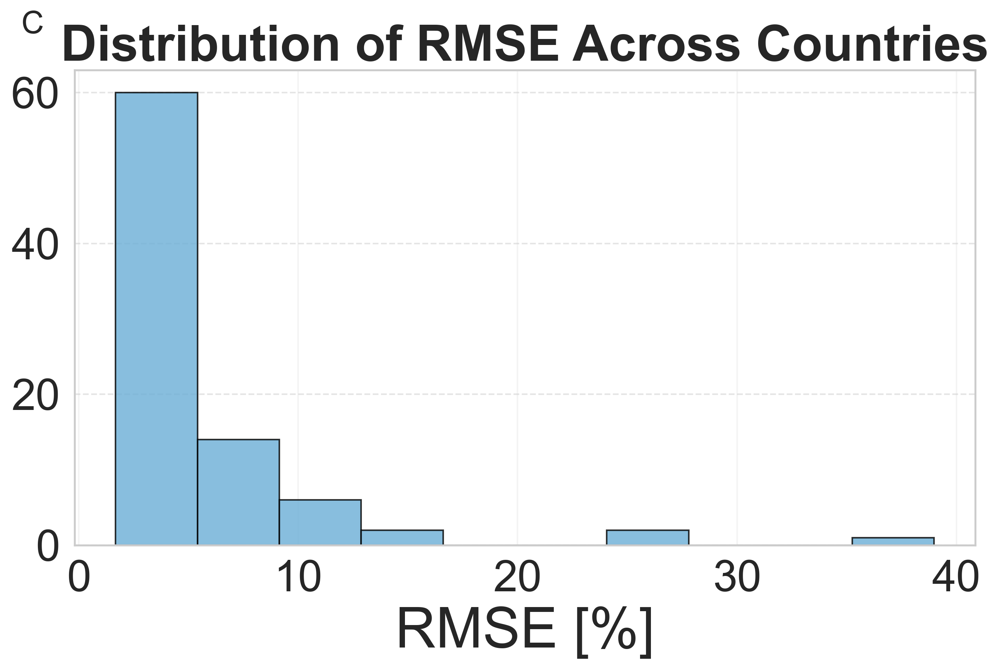

In [107]:
# Histogram of RMSE
fig = plt.figure(figsize=(9,6))
plt.hist(country_metrics["avg_RMSE_ratio"]*100, bins=10, color="#6baed6", edgecolor="black", alpha=0.8)
plt.xlabel("RMSE [%]", fontsize=36)
#plt.ylabel("Number of countries", fontsize=36)
plt.title("Distribution of RMSE Across Countries", fontsize=32, fontweight="bold")
# Grid and tick labels
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tick_params(axis='both', which='major', labelsize=28)
fig.text(0.03, 0.99, 'C', fontsize=20, va='top', ha='left')


#plt.xlim(-5, 1)  # zoom in on realistic R² values
plt.tight_layout()
plt.savefig('/Users/charlottecockburn/Downloads/rmse_dist.png')
plt.show()


In [11]:
features = ['cdd_sum_sum', 'Population', 'GDP', 'avg_ELD']
target = 'demand_gwh'
countries = [c for c, df_c in wdf.groupby('Country') if len(df_c.dropna(subset=features+[target])) >= 5]

n_splits = 10
all_results = []

for country_name in countries:
    df = wdf[wdf['Country']==country_name][features+[target]].dropna()
    X = df[features].values
    y = df[target].values
    
    if len(y) < 2: 
        continue
    
    ss = ShuffleSplit(n_splits=n_splits, test_size=0.2, random_state=42)
    fold_importances = []

    for train_idx, test_idx in ss.split(X):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]
        
        if len(y_test) < 2: 
            continue
        
        model = LinearRegression()
        model.fit(X_train, y_train)
        
        perm_importance = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42)
        fold_importances.append(perm_importance.importances_mean)

    fold_importances = np.array(fold_importances)
    
    # Average permutation importance across folds
    mean_importances = fold_importances.mean(axis=0)
    
    # Identify top variable
    top_var_idx = mean_importances.argmax()
    top_var = features[top_var_idx]
    
    all_results.append({
        'Country': country_name,
        **{f'{f}_importance': mean_importances[i] for i, f in enumerate(features)},
        'top_variable': top_var
    })

country_perm_importance = pd.DataFrame(all_results)

In [12]:
print('Number where CDD is best:', len(country_perm_importance[country_perm_importance['top_variable']=='cdd_sum_sum']))

Number where CDD is best: 29


## Figure 6

In [108]:
def mapping_stuff(df, var_name, cmap_name, vmin, vmax, extend, title, cbar_label, outname, hatching = None, simplify_tolerance = None, letter = None, location = [0.14, 0.97]): 
        
    # ---------- User parameters ----------
    outpath = "/Users/charlottecockburn/Downloads/" + outname
    figsize = (12, 6.5)
    n_bins = 10                             # number of boxes in the colorbar
    simplify_tolerance = 0.05               # set to None to skip simplification
    # -------------------------------------
    
    # Work on a copy to avoid modifying the original
    world = df.copy()
    
    # Ensure lon/lat CRS
    if world.crs is None:
        raise ValueError("world_pct.crs is not set. Please set world_pct.crs to EPSG:4326.")
    if world.crs.to_string() != "EPSG:4326":
        world = world.to_crs(epsg=4326)

    # Optional simplification (safe for plotting; adjust tolerance if needed)
    if simplify_tolerance is not None:
        world["geometry"] = world["geometry"].apply(lambda g: g.simplify(simplify_tolerance) if g is not None else g)
    
    # Split data / nodata
    world_with = world.dropna(subset=[var_name])
    world_no = world[world[var_name].isna()]
    
    if world_with.empty:
        raise ValueError("No rows with pct_change values found (all NaN).")
    
    # Create discrete colormap and norm (boxes)
    bounds = np.linspace(vmin, vmax, n_bins + 1)        # boundaries of the boxes
    n_colors = len(bounds) - 1
    #cmap = mpl.cm.get_cmap(cmap_name, n_colors)         # discrete colormap with n_colors entries
    cmap = mpl.colormaps[cmap_name].resampled(n_colors)
    norm = mpl.colors.BoundaryNorm(bounds, ncolors=n_colors, clip=True)
    
    
    # Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
    #   cmap = mpl.cm.get_cmap(cmap_name, n_colors)         # discrete colormap with n_colors entries
    
    
    
    # Figure and Robinson axis
    fig = plt.figure(figsize=figsize)
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()
    
    # Light background
    ax.add_feature(cfeature.OCEAN, facecolor="#f5f5f5", zorder=0)
    ax.coastlines(linewidth=0.4, zorder=4)

    # Plot countries without data
    if not world_no.empty:
        world_no.plot(ax=ax,
                      facecolor="#e8e8e8",
                      edgecolor="white",
                      linewidth=0.3,
                      zorder=1,
                      transform=ccrs.PlateCarree())
    
    # Plot countries with data (use transform so GeoPandas interprets lon/lat)
    world_with.plot(column=var_name,
                    cmap=cmap,
                    norm=norm,
                    ax=ax,
                    linewidth=0.3,
                    edgecolor="white",
                    zorder=2,
                    transform=ccrs.PlateCarree())

    if hatching: 
        sig = world_with[hatching] < 0.05
        if sig.any():
            sig_countries = world_with.loc[sig].to_crs(epsg=4326)
    
            # Plot hatch *after* all color layers
            sig_countries.plot(
                ax=ax,
                facecolor="none",
                edgecolor="#cccccc",
                hatch="/////",
                linewidth=0.15,
                transform=ccrs.PlateCarree(),
                zorder=5   # ensure on top
            )
    
            legend_handles = [
                Patch(facecolor='none', edgecolor='black', hatch='///', label='p < 0.05 (paired t-test)'),
                Patch(facecolor='#f0f0f0', edgecolor='black', label='No data')
            ]

    # Tidy up map frame
    ax.axis("off")
    
    # Prepare ScalarMappable for the colorbar (use the same cmap & norm)
    sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
    # Use the values clipped into the [vmin, vmax] range so colorbar ticks align well
    sm.set_array(np.clip(world_with[var_name].values, vmin, vmax))
    
    # Reserve room at bottom and create colorbar axes
    plt.subplots_adjust(bottom=0.16)
    cbar_ax = fig.add_axes([0.18, 0.055, 0.64, 0.05])   # [left, bottom, width, height]
    
    # Create the colorbar with discrete boxes
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation="horizontal",
                        boundaries=bounds, ticks=bounds, spacing="proportional", extend = extend)
    cbar.ax.tick_params(labelsize=12, pad=6)
    cbar.set_label(cbar_label, fontsize=16, labelpad=6)
    
    # Give a clean white background for the colorbar area
    cbar_ax.set_facecolor("white")
    
    # Title and save
    fig.suptitle(title, fontsize=22, y=0.96)
    fig.text(location[0], location[1], letter, fontsize=20, va='top', ha='left')

    
    plt.savefig(outpath, dpi=300, bbox_inches="tight")
    plt.show()

In [109]:
features_base = ['GDP', 'Population']
features_cdd  = ['GDP', 'Population', 'cdd_sum_sum']
target = 'demand_gwh'

countries = [c for c, df_c in wdf.groupby('Country') 
             if len(df_c.dropna(subset=features_cdd+[target])) >= 5]
results = []
n_splits = 100

for country_name in countries:
    df = wdf[wdf['Country']==country_name][features_cdd+[target]].dropna()
    df2 = wdf[wdf['Country']==country_name][['avg_temp', 'GDP', 'Population', 'AC']].dropna()
    
    X_base = df[features_base].values
    X_cdd  = df[features_cdd].values
    y = df[target].values
    
    mean_temp  = df2['avg_temp'].mean()
    gdp_capita = (df2['GDP']/df2['Population']).mean()
    saturation = df2['AC'].iloc[0]
    
    if len(y) < 2:
        print(f"Skipping {country_name}, not enough samples")
        continue
    
    ss = ShuffleSplit(n_splits=n_splits, test_size=0.2, random_state=42)
    
    r2_base_splits, r2_cdd_splits = [], []
    nrmse_base_splits, nrmse_cdd_splits = [], []
    
    for train_idx, test_idx in ss.split(X_base):
        if len(test_idx) < 2:
            continue
        
        y_train, y_test = y[train_idx], y[test_idx]
        
        # ------------------
        # Base model
        # ------------------
        model_base = LinearRegression()
        model_base.fit(X_base[train_idx], y_train)
        pred_base = model_base.predict(X_base[test_idx])
        
        r2_base_splits.append(r2_score(y_test, pred_base))
        
        rmse_base = np.sqrt(mean_squared_error(y_test, pred_base))
        nrmse_base = rmse_base / np.mean(y_test) if np.mean(y_test) != 0 else np.nan
        nrmse_base_splits.append(nrmse_base)
        
        # ------------------
        # CDD model
        # ------------------
        model_cdd = LinearRegression()
        model_cdd.fit(X_cdd[train_idx], y_train)
        pred_cdd = model_cdd.predict(X_cdd[test_idx])
        
        r2_cdd_splits.append(r2_score(y_test, pred_cdd))
        
        rmse_cdd = np.sqrt(mean_squared_error(y_test, pred_cdd))
        nrmse_cdd = rmse_cdd / np.mean(y_test) if np.mean(y_test) != 0 else np.nan
        nrmse_cdd_splits.append(nrmse_cdd)

    # Convert to arrays
    r2_base_splits  = np.array(r2_base_splits)
    r2_cdd_splits   = np.array(r2_cdd_splits)
    nrmse_base_splits = np.array(nrmse_base_splits)
    nrmse_cdd_splits  = np.array(nrmse_cdd_splits)
    
    # ------------------
    # Averages & deltas
    # ------------------
    avg_r2_base = np.mean(r2_base_splits)
    avg_r2_cdd  = np.mean(r2_cdd_splits)
    delta_r2    = avg_r2_cdd - avg_r2_base
    
    avg_nrmse_base = np.mean(nrmse_base_splits)
    avg_nrmse_cdd  = np.mean(nrmse_cdd_splits)
    delta_nrmse    = avg_nrmse_cdd - avg_nrmse_base     # NOTE: negative = improvement
    
    # ------------------
    # Standard errors
    # ------------------
    se_r2_base  = np.std(r2_base_splits, ddof=1)/np.sqrt(len(r2_base_splits))
    se_r2_cdd   = np.std(r2_cdd_splits,  ddof=1)/np.sqrt(len(r2_cdd_splits))
    se_nrmse_base = np.std(nrmse_base_splits, ddof=1)/np.sqrt(len(nrmse_base_splits))
    se_nrmse_cdd  = np.std(nrmse_cdd_splits,  ddof=1)/np.sqrt(len(nrmse_cdd_splits))
    
    # ------------------
    # Paired significance tests
    # ------------------
    if len(r2_base_splits) > 1:
        _, p_r2 = ttest_rel(r2_cdd_splits, r2_base_splits)
        _, p_nrmse = ttest_rel(nrmse_cdd_splits, nrmse_base_splits)
    else:
        p_r2 = np.nan
        p_nrmse = np.nan
    
    results.append({
        "Country": country_name,
        "avg_R2_base": avg_r2_base,
        "avg_R2_cdd": avg_r2_cdd,
        "delta_R2": delta_r2,
        "se_R2_base": se_r2_base,
        "se_R2_cdd": se_r2_cdd,
        "pval_delta_r2": p_r2,
        
        # NEW FIELDS
        "avg_nRMSE_base": avg_nrmse_base,
        "avg_nRMSE_cdd": avg_nrmse_cdd,
        "delta_nRMSE": delta_nrmse,       # < 0 means improvement
        "se_nRMSE_base": se_nrmse_base,
        "se_nRMSE_cdd": se_nrmse_cdd,
        "pval_delta_nrmse": p_nrmse,
        
        # Covariates
        "avg_temp": mean_temp,
        "gdp_capita": gdp_capita,
        "AC": saturation
    })

country_metrics_delta = pd.DataFrame(results)

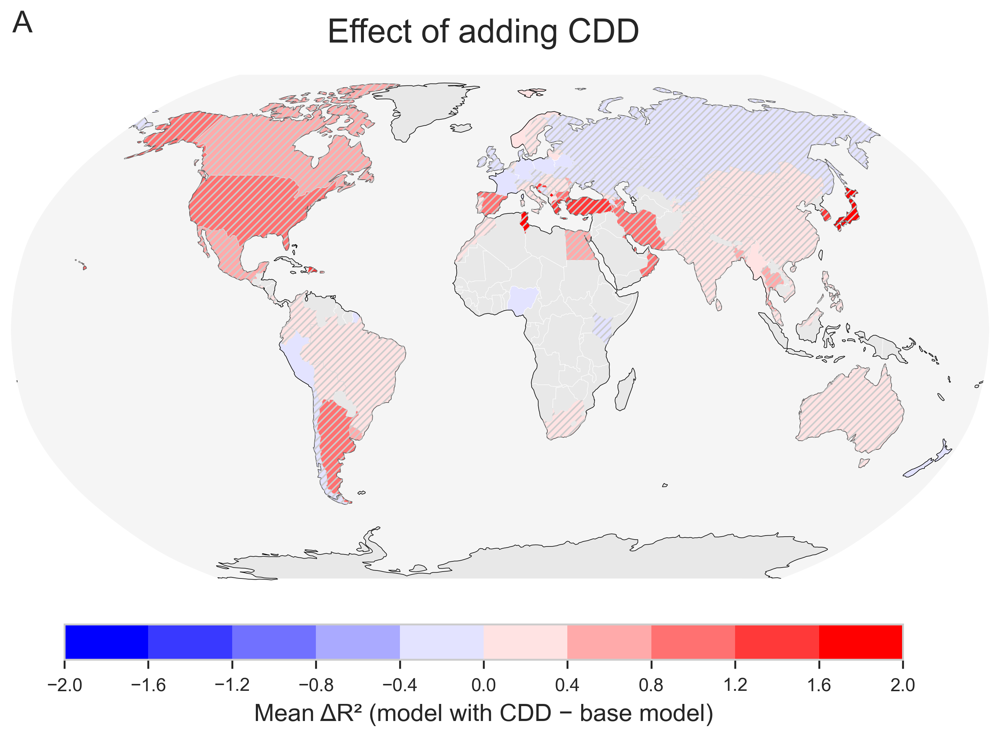

In [110]:
R2_delta_map = gdf.merge(country_metrics_delta[['Country', 'delta_R2', 'pval_delta_r2']], 
                        left_on='ADMIN', right_on='Country', 
                        how='left')

mapping_stuff(R2_delta_map, 'delta_R2', 'bwr', -2, 2, 'neither', 'Effect of adding CDD', 
              'Mean ΔR² (model with CDD − base model)', 'deltaCDD_map.png', hatching = 'pval_delta_r2', 
             letter = 'A')

In [111]:
# ----------------------
# Monte Carlo CV & delta R2 (avg_ELD instead of CDD)
# ----------------------
features_base = ['GDP', 'Population']
features_eld  = ['GDP', 'Population','avg_ELD']
target = 'demand_gwh'

countries = [c for c, df_c in wdf.groupby('Country') 
             if len(df_c.dropna(subset=features_eld+[target])) >= 5]

results = []
n_splits = 100

for country_name in countries:
    df = wdf[wdf['Country']==country_name][features_eld+[target]].dropna()
    df2 = wdf[wdf['Country']==country_name][['avg_temp', 'GDP', 'Population', 'AC']].dropna()
    
    mean_temp  = df2['avg_temp'].mean()
    gdp_capita = (df2['GDP']/df2['Population']).mean()
    saturation = df2['AC'].iloc[0]


    X_base = df[features_base].values
    X_eld  = df[features_eld].values
    y = df[target].values
    
    if len(y) < 2:
        print(f"Skipping {country_name}, not enough samples")
        continue
    
    ss = ShuffleSplit(n_splits=n_splits, test_size=0.2, random_state=42)
    
    r2_base_splits, r2_eld_splits = [], []
    
    for train_idx, test_idx in ss.split(X_base):
        if len(test_idx) < 2:
            continue
        
        # Base model
        model_base = LinearRegression()
        model_base.fit(X_base[train_idx], y[train_idx])
        y_pred_base = model_base.predict(X_base[test_idx])
        r2_base_splits.append(r2_score(y[test_idx], y_pred_base))
        
        # avg_ELD model
        model_eld = LinearRegression()
        model_eld.fit(X_eld[train_idx], y[train_idx])
        y_pred_eld = model_eld.predict(X_eld[test_idx])
        r2_eld_splits.append(r2_score(y[test_idx], y_pred_eld))
    
    # Convert to arrays
    r2_base_splits = np.array(r2_base_splits)
    r2_eld_splits  = np.array(r2_eld_splits)
    
    # Mean & delta
    avg_r2_base, avg_r2_eld = np.mean(r2_base_splits), np.mean(r2_eld_splits)
    delta_r2 = avg_r2_eld - avg_r2_base
    
    # Standard error
    se_r2_base = np.std(r2_base_splits, ddof=1)/np.sqrt(len(r2_base_splits))
    se_r2_eld  = np.std(r2_eld_splits, ddof=1)/np.sqrt(len(r2_eld_splits))
    
    # Paired t-test
    if len(r2_base_splits) > 1:
        t_stat, p_val = ttest_rel(r2_eld_splits, r2_base_splits)
    else:
        p_val = np.nan
    
    results.append({
        "Country": country_name,
        "avg_R2_base": avg_r2_base,
        "avg_R2_eld": avg_r2_eld,
        "delta_R2": delta_r2,
        "se_R2_base": se_r2_base,
        "se_R2_eld": se_r2_eld,
        "pval_delta_r2": p_val,
        # Covariates
        "avg_temp": mean_temp,
        "gdp_capita": gdp_capita,
        "AC": saturation
    })

country_metrics_delta_eld = pd.DataFrame(results)

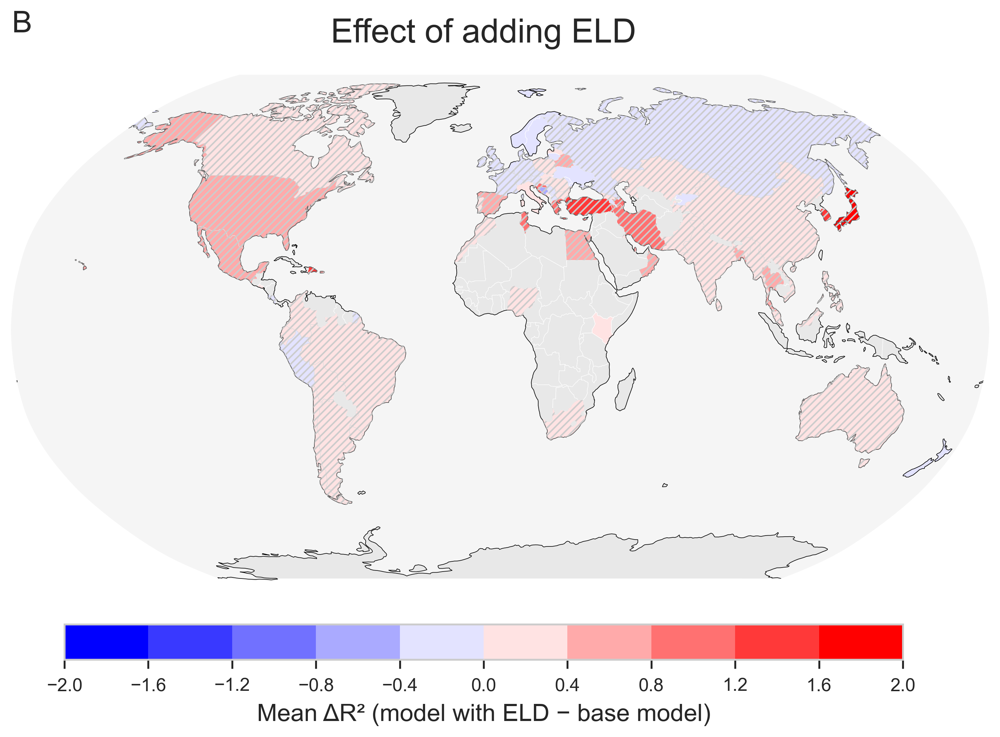

In [112]:
# Merge percent change onto world map
R2_delta_map_eld = gdf.merge(country_metrics_delta_eld[['Country', 'delta_R2', 'pval_delta_r2']], 
                        left_on='ADMIN', right_on='Country', 
                        how='left')

mapping_stuff(R2_delta_map_eld, 'delta_R2', 'bwr', -2, 2, 'neither', 'Effect of adding ELD', 
              'Mean ΔR² (model with ELD − base model)', 'deltaELD_map.png', hatching = 'pval_delta_r2', 
             letter = 'B')

In [113]:
# ----------------------
# Monte Carlo CV & delta R2 (avg_ELD instead of CDD)
# ----------------------
features_base = ['GDP', 'Population', 'cdd_sum_sum']
features_eld  = ['GDP', 'Population', 'cdd_sum_sum','avg_ELD']
target = 'demand_gwh'

countries = [c for c, df_c in wdf.groupby('Country') 
             if len(df_c.dropna(subset=features_eld+[target])) >= 5]

results = []
n_splits = 100

for country_name in countries:
    df = wdf[wdf['Country']==country_name][features_eld+[target]].dropna()
    df2 = wdf[wdf['Country']==country_name][['avg_temp', 'GDP', 'Population', 'AC']].dropna()
    
    mean_temp  = df2['avg_temp'].mean()
    gdp_capita = (df2['GDP']/df2['Population']).mean()
    saturation = df2['AC'].iloc[0]


    X_base = df[features_base].values
    X_eld  = df[features_eld].values
    y = df[target].values
    
    if len(y) < 2:
        print(f"Skipping {country_name}, not enough samples")
        continue
    
    ss = ShuffleSplit(n_splits=n_splits, test_size=0.2, random_state=42)
    
    r2_base_splits, r2_eld_splits = [], []
    
    for train_idx, test_idx in ss.split(X_base):
        if len(test_idx) < 2:
            continue
        
        # Base model
        model_base = LinearRegression()
        model_base.fit(X_base[train_idx], y[train_idx])
        y_pred_base = model_base.predict(X_base[test_idx])
        r2_base_splits.append(r2_score(y[test_idx], y_pred_base))
        
        # avg_ELD model
        model_eld = LinearRegression()
        model_eld.fit(X_eld[train_idx], y[train_idx])
        y_pred_eld = model_eld.predict(X_eld[test_idx])
        r2_eld_splits.append(r2_score(y[test_idx], y_pred_eld))
    
    # Convert to arrays
    r2_base_splits = np.array(r2_base_splits)
    r2_eld_splits  = np.array(r2_eld_splits)
    
    # Mean & delta
    avg_r2_base, avg_r2_eld = np.mean(r2_base_splits), np.mean(r2_eld_splits)
    delta_r2 = avg_r2_eld - avg_r2_base
    
    # Standard error
    se_r2_base = np.std(r2_base_splits, ddof=1)/np.sqrt(len(r2_base_splits))
    se_r2_eld  = np.std(r2_eld_splits, ddof=1)/np.sqrt(len(r2_eld_splits))
    
    # Paired t-test
    if len(r2_base_splits) > 1:
        t_stat, p_val = ttest_rel(r2_eld_splits, r2_base_splits)
    else:
        p_val = np.nan
    
    results.append({
        "Country": country_name,
        "avg_R2_base": avg_r2_base,
        "avg_R2_eld": avg_r2_eld,
        "delta_R2": delta_r2,
        "se_R2_base": se_r2_base,
        "se_R2_eld": se_r2_eld,
        "pval_delta_r2": p_val,
        # Covariates
        "avg_temp": mean_temp,
        "gdp_capita": gdp_capita,
        "AC": saturation
    })

country_metrics_delta_eld2 = pd.DataFrame(results)

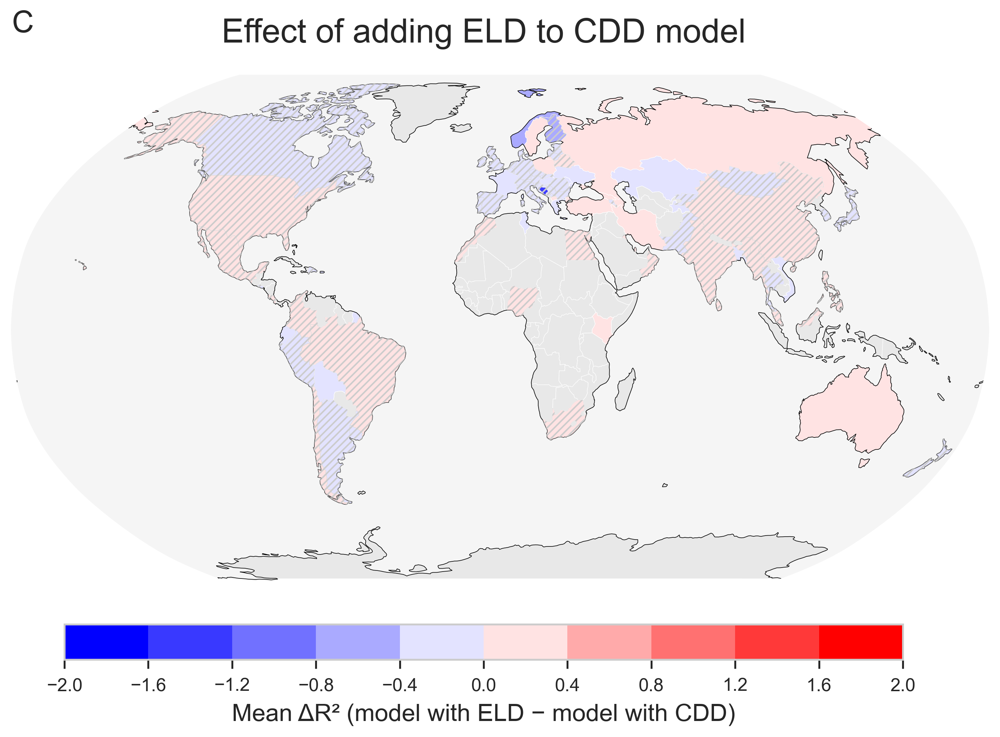

In [114]:
# Merge percent change onto world map
R2_delta_map_eld2 = gdf.merge(country_metrics_delta_eld2[['Country', 'delta_R2', 'pval_delta_r2']], 
                        left_on='ADMIN', right_on='Country', 
                        how='left')

mapping_stuff(R2_delta_map_eld2, 'delta_R2', 'bwr', -2, 2, 'neither', 'Effect of adding ELD to CDD model', 
              'Mean ΔR² (model with ELD − model with CDD)', 'deltaELD_CDD_map.png', hatching = 'pval_delta_r2', 
             letter = 'C')

/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_10443/1613838284.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(['temp_class','gdp_class'])['delta_R2'].mean()


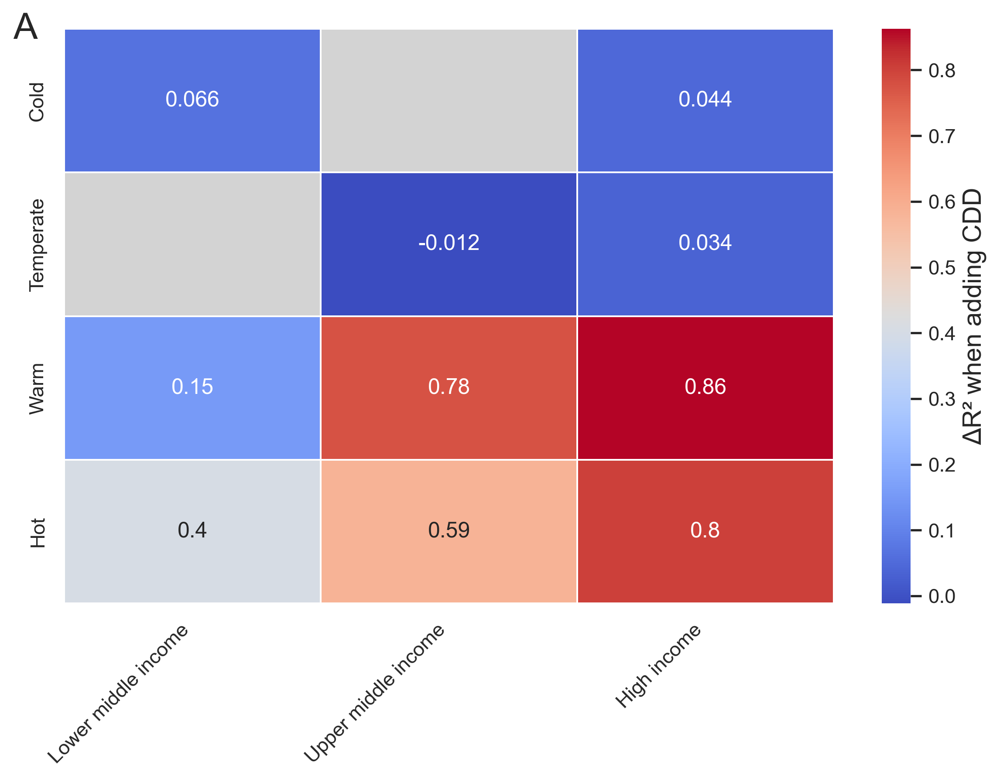

In [115]:
df = country_metrics_delta[['Country', 'delta_R2', 'avg_temp', 'gdp_capita']]
df = df.merge(dfi[['Country', 'Income group']], on='Country', how='left')

df['temp_class'] = pd.cut(
    df['avg_temp'],
    bins=[-10, 15, 20, 25, 50],
    labels=['Cold', 'Temperate', 'Warm','Hot']
)

income_order = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

df['gdp_class'] = pd.Categorical(
    df['Income group'],
    categories=income_order,
    ordered=True
)

df.groupby(['temp_class','gdp_class'])['delta_R2'].mean()

# Create pivot as before
pivot = df.pivot_table(
    index='temp_class',
    columns='gdp_class',
    values='delta_R2',
    aggfunc='mean'
)

# --- 1. Set NaNs to show as gray ---
cmap = sns.color_palette("coolwarm", as_cmap=True)
cmap.set_bad(color="lightgray")     # color for NaN squares

# --- 2. Make the heatmap ---
fig = plt.figure(figsize=(8,6))
ax = sns.heatmap(
    pivot,
    annot=True,
    cmap=cmap,
    linewidths=0.5,
    linecolor='white',
    cbar=True
)

# --- 3. Remove axis label strings ---
ax.set_xlabel("")   # removes "gdp_class"
ax.set_ylabel("")   # removes "temp_class"

# --- 4. Colorbar label with delta symbol ---
cbar = ax.collections[0].colorbar
cbar.set_label("ΔR² when adding CDD", fontsize=14)

# Optional: rotate tick labels for readability
plt.xticks(rotation=45, ha="right")
fig.text(0.01, 0.99, 'A', fontsize=20, va='top', ha='left')


plt.tight_layout()
plt.savefig('/Users/charlottecockburn/Downloads/magnumopus.png')
plt.show()



/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_10443/1833837358.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(['temp_class','AC_class'])['delta_R2'].mean()


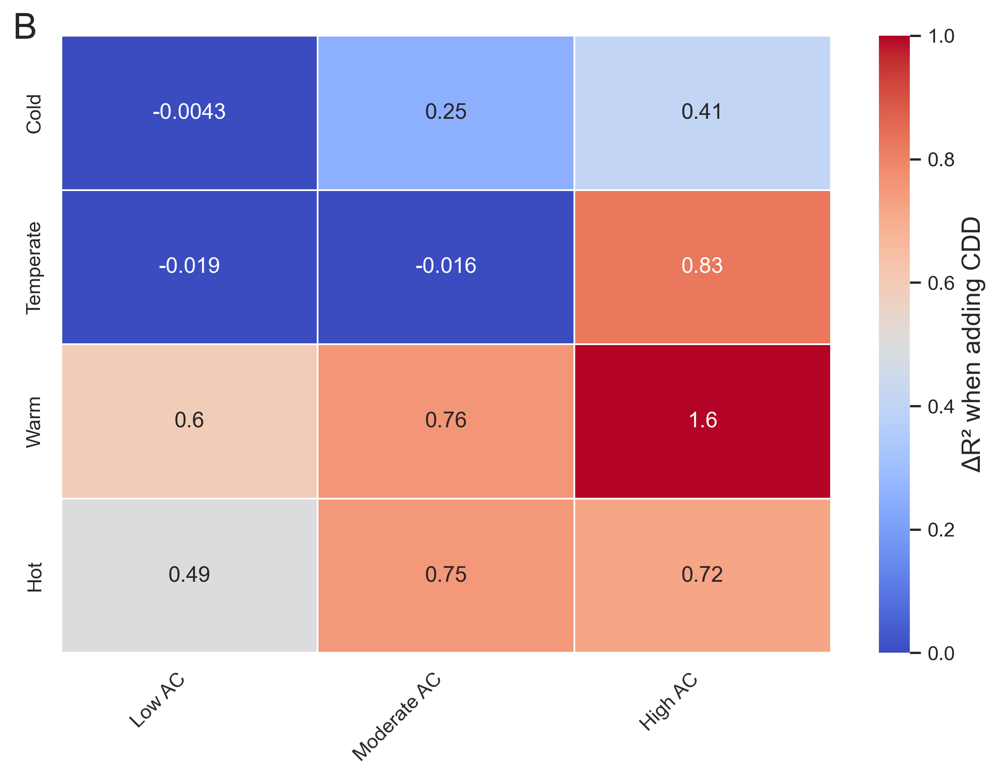

In [116]:
df = country_metrics_delta[['Country', 'delta_R2', 'avg_temp', 'gdp_capita', 'AC']]
df = df.merge(dfi[['Country', 'Income group']], on='Country', how='left')

df['temp_class'] = pd.cut(
    df['avg_temp'],
    bins=[-10, 15, 20, 25, 50],
    labels=['Cold', 'Temperate', 'Warm','Hot']
)

income_order = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

df['gdp_class'] = pd.Categorical(
    df['Income group'],
    categories=income_order,
    ordered=True
)

df['AC_class'] = pd.cut(
    df['AC'],
    bins=[0, 30, 60, 100],
    labels=['Low AC', 'Moderate AC', 'High AC']
)

df.groupby(['temp_class','AC_class'])['delta_R2'].mean()

# Create pivot as before
pivot = df.pivot_table(
    index='temp_class',
    columns='AC_class',
    values='delta_R2',
    aggfunc='mean'
)

# --- 1. Set NaNs to show as gray ---
cmap = sns.color_palette("coolwarm", as_cmap=True)
cmap.set_bad(color="lightgray")     # color for NaN squares

# --- 2. Make the heatmap ---
fig = plt.figure(figsize=(8,6))
ax = sns.heatmap(
    pivot,
    annot=True,
    cmap=cmap,
    linewidths=0.5,
    linecolor='white',
    cbar=True, 
    vmin=0,
    vmax= 1
)

# --- 3. Remove axis label strings ---
ax.set_xlabel("")   # removes "gdp_class"
ax.set_ylabel("")   # removes "temp_class"

# --- 4. Colorbar label with delta symbol ---
cbar = ax.collections[0].colorbar
cbar.set_label("ΔR² when adding CDD", fontsize=14)

# Optional: rotate tick labels for readability
plt.xticks(rotation=45, ha="right")
fig.text(0.01, 0.99, 'B', fontsize=20, va='top', ha='left')


plt.tight_layout()
plt.savefig('/Users/charlottecockburn/Downloads/magnumopus_AC.png')
plt.show()

## Supplementary figures

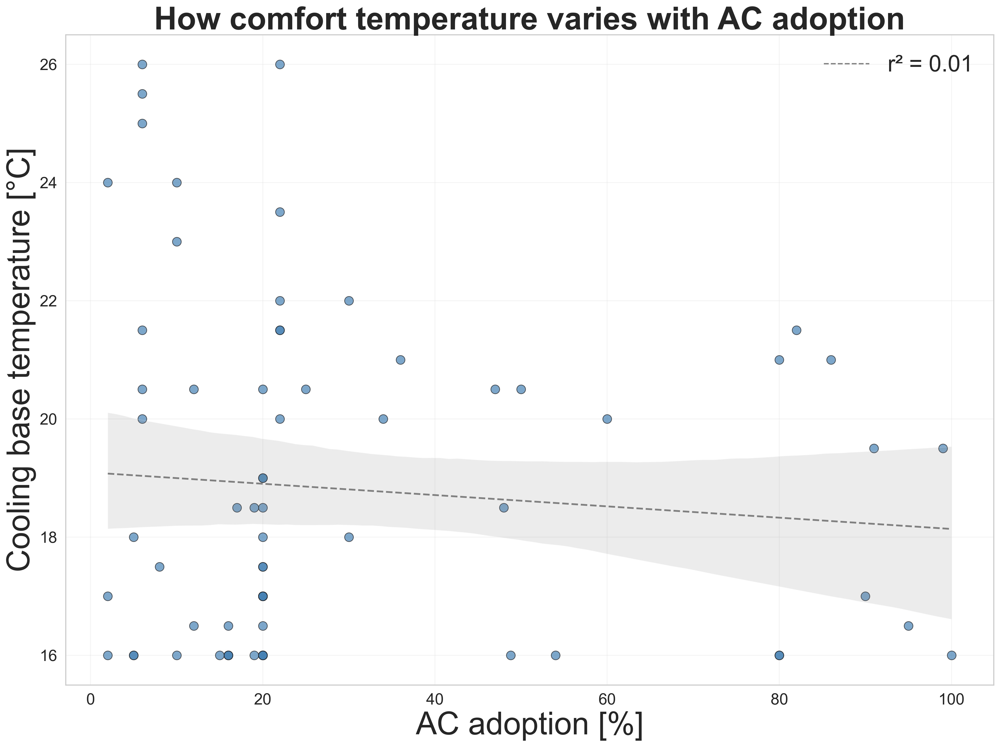

In [154]:
tb_ac = results_df[['Country', 'Tb_cool']].merge(dfs[['Country', 'AC']], on = 'Country')
tb_ac = tb_ac.dropna()

sns.set(style="whitegrid")  # consistent style
fig, ax = plt.subplots(1, 1, figsize=(16, 12))
#axes = axes.flatten()  # easier indexing

x = 'AC'
y = 'Tb_cool'
X = sm.add_constant(tb_ac[x])
model = sm.OLS(tb_ac[y], X).fit()
r2 = model.rsquared
pval = model.pvalues[x]
# Scatter
sns.scatterplot(data=tb_ac, x=x, y=y, s=100, ax=ax, color='steelblue', edgecolor='k', alpha=0.7)

# Dashed fit line
sns.regplot(
    data=tb_ac, x=x, y=y,
    scatter=False, ax=ax,
    color='gray',
    line_kws={'linestyle': 'dashed', 'linewidth': 2}
)

# Legend with R²
legend_text = f"r² = {r2:.2f}"
legend_handles = [Line2D([], [], color='gray', linestyle='--', label=legend_text)]
ax.legend(handles=legend_handles, fontsize=26)

# Labels
#ax.set_ylim([0,1])
ax.set_xlabel('AC adoption [%]', fontsize=36)
ax.set_ylabel('Cooling base temperature [°C]', fontsize=36)
ax.set_title('How comfort temperature varies with AC adoption', fontsize = 36)
ax.tick_params(labelsize=18)

plt.tight_layout()
plt.savefig('/Users/charlottecockburn/Downloads/ac_tb.png', dpi=300)
plt.show()




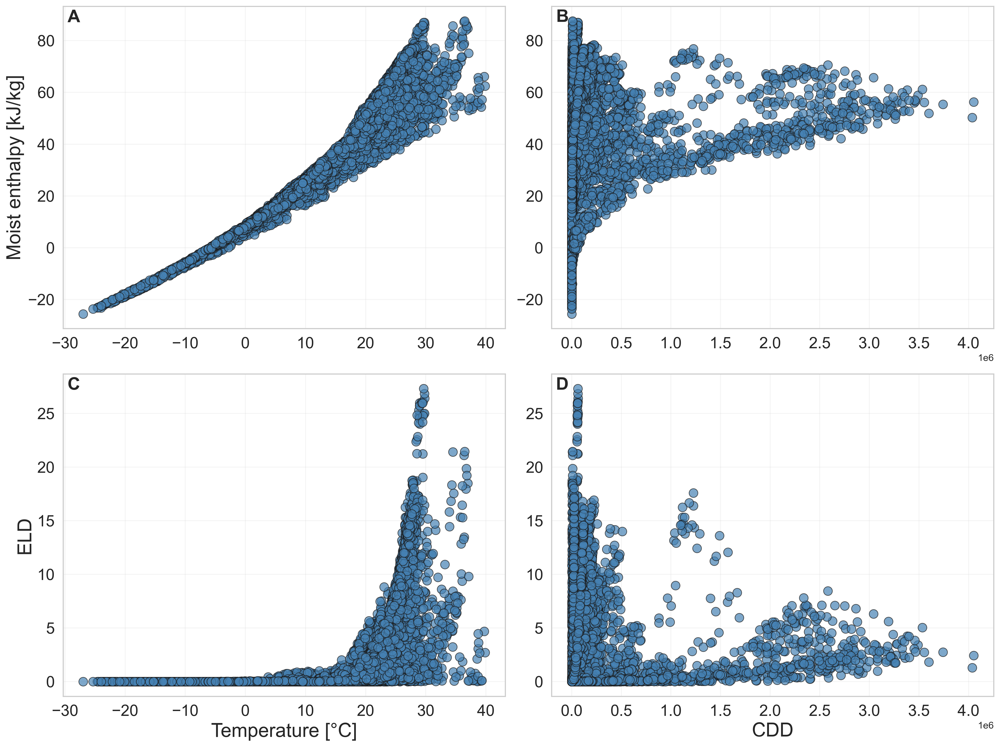

In [124]:
sns.set(style="whitegrid")  # consistent style

# --- Define 2x2 figure ---
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()  # easier indexing

# --- Helper function for plotting ---
def enthalpy_temperature(ax, x, y, xlabel = None, ylabel = None, subset=None, letter = None):
    """Scatter + OLS fit line + legend with R² (subset optional)."""
    X = sm.add_constant(mdf[x])
    model = sm.OLS(mdf[y], X).fit()
    r2 = model.rsquared
    pval = model.pvalues[x]

    # Scatter
    sns.scatterplot(data=mdf, x=x, y=y, s=100, ax=ax, color='steelblue', edgecolor='k', alpha=0.7)

    # Labels
    ax.set_xlabel(xlabel, fontsize=22)
    ax.set_ylabel(ylabel, fontsize=22)
    ax.tick_params(labelsize=18)
    ax.text(0.01, 0.99, letter, transform=ax.transAxes,fontsize=20, fontweight='bold', va='top', ha='left')

# --- Plot 1: Temp vs. enthalpy ---
enthalpy_temperature(
    axes[0], x='avg_temp', y='avg_Q_x',
    #xlabel='Temperature [°C]',
    ylabel='Moist enthalpy [kJ/kg]',
    letter = 'A'
)

# --- Plot 2: CDD vs. enthalpy ---
enthalpy_temperature(
    axes[1], x='cdd_sum_sum', y='avg_Q_x',
    #xlabel='CDD',
    #ylabel='CDD/electricity r²',
    letter = 'B'
)

# --- Plot 3: Temp vs. ELD ---
enthalpy_temperature(
    axes[2], x='avg_temp', y='avg_ELD',
    xlabel='Temperature [°C]',
    ylabel='ELD',
    letter = 'C',
)

# --- Plot 4: GDP per capita in hot countries ---
enthalpy_temperature(
    axes[3], x='cdd_sum_sum', y='avg_ELD',
    xlabel='CDD',
    #ylabel='CDD/electricity r²',
    letter = 'D',
)

plt.tight_layout()
plt.savefig('/Users/charlottecockburn/Downloads/enthalpy_2x2.png', dpi=300)
plt.show()

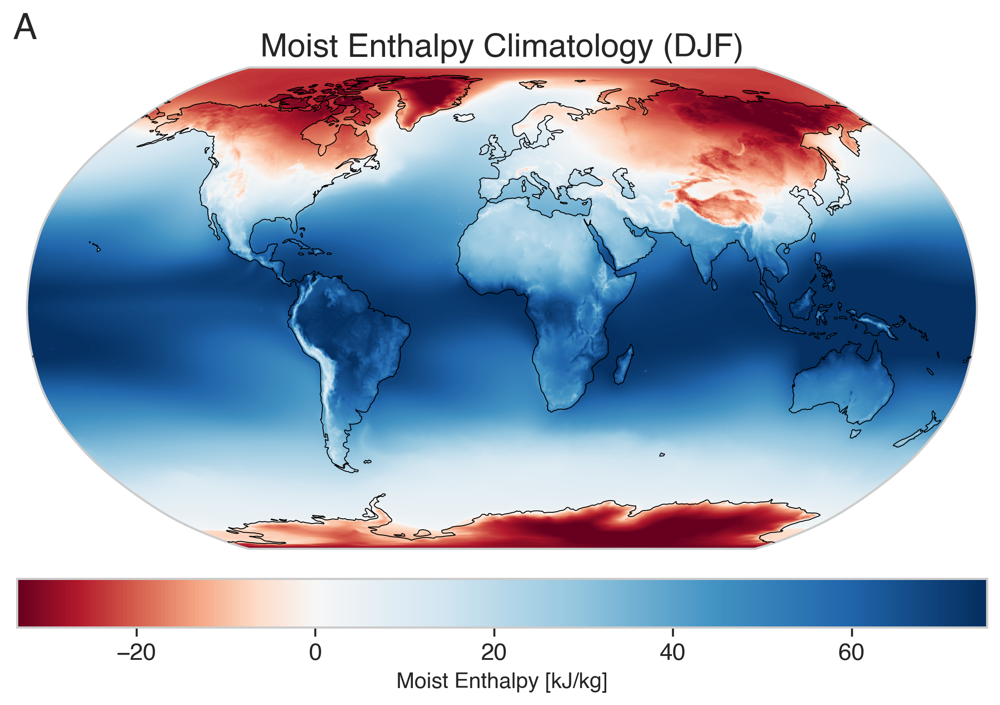

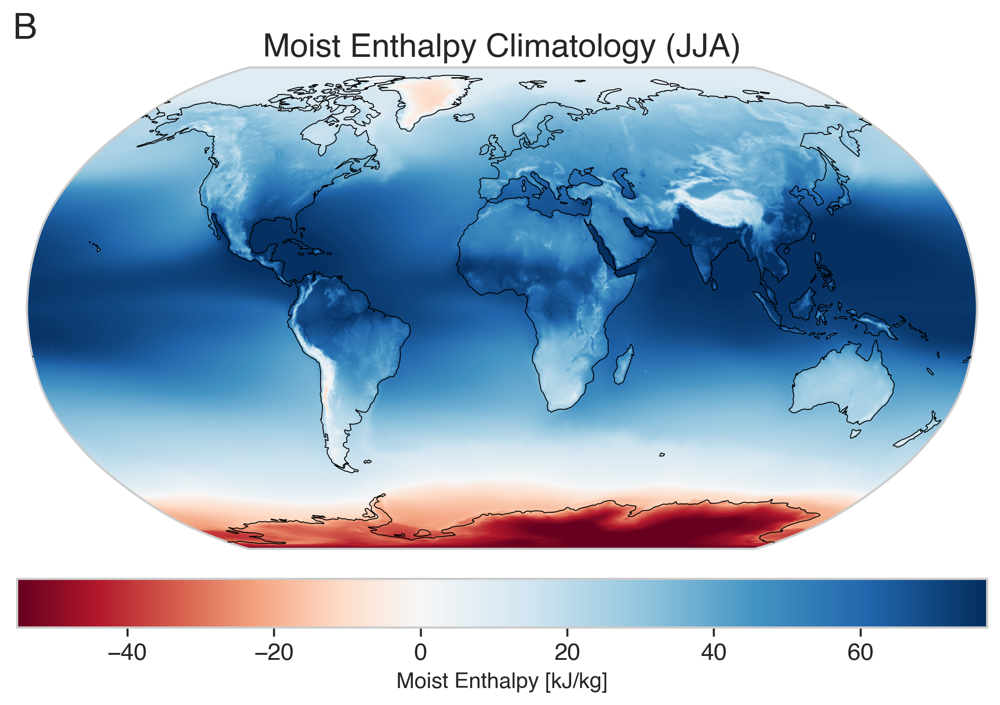

In [133]:

# small additions to your imports
import matplotlib.colors as mcolors
import xarray as xr

# helper to shift a colormap's midpoint
def shifted_cmap(cmap, midpoint=0.5, name='shiftedcmap'):
    """
    Shift the center of a colormap to the specified midpoint (0..1).
    This remaps the colormap so that its "center" color is at `midpoint`.
    """
    if not 0 <= midpoint <= 1:
        raise ValueError("midpoint must be between 0 and 1")

    cdict = {'red': [], 'green': [], 'blue': [], 'alpha': []}

    reg_index = np.linspace(0, 1, 257)
    # build new indices that put the original 0..1 range into 0..midpoint and midpoint..1
    shift_index = np.hstack([
        np.linspace(0.0, midpoint, 128, endpoint=False),
        np.linspace(midpoint, 1.0, 129, endpoint=True)
    ])

    for ri, si in zip(reg_index, shift_index):
        r, g, b, a = cmap(ri)
        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))

    return mcolors.LinearSegmentedColormap(name, cdict)

# ------------------------------------------------------
# Plotting Function (shifted midpoint, proportional colorbar)
# ------------------------------------------------------
def plot_season(ds, season, varname, letter = None):

    da = ds[varname].sel(season=season)

    fig = plt.figure(figsize=(12, 6))
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()

    ax.add_feature(cfeature.LAND, facecolor="#e0e0e0", zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, zorder=5)

    # Compute vmin/vmax from data (clip extremes)
    vmin = float(da.quantile(0.02))
    vmax = float(da.quantile(0.98))

    # handle edge cases
    if vmax == vmin:
        vmax = vmin + 1e-6

    # fraction of the colorbar where zero should lie
    if vmin < 0 < vmax:
        frac = (0.0 - vmin) / (vmax - vmin)
        # clamp to small epsilon from 0/1 to avoid degenerate cmap
        frac = np.clip(frac, 1e-6, 1-1e-6)
        base_cmap = plt.get_cmap("RdBu")
        cmap = shifted_cmap(base_cmap, midpoint=frac, name=f"shifted_RdBu_r_{season}")
    else:
        # all positive or all negative: no need to shift midpoint
        cmap = plt.get_cmap("RdBu")

    # Use a linear Normalize so colors are proportional to numeric range
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    # Plot with shading="auto", using ERA5 lon/lat centers directly
    im = ax.pcolormesh(
        ds.longitude,
        ds.latitude,
        da,
        cmap=cmap,
        shading="auto",
        norm=norm,
        transform=ccrs.PlateCarree()
    )

    # Title
    plt.title(f"Moist Enthalpy Climatology ({season})", fontsize=18)
    fig.text(0.2, 0.95, letter, fontsize=20, va='top', ha='left')


    # Colorbar (horizontal)
    cbar = plt.colorbar(im, orientation="horizontal", pad=0.05, shrink=0.8)
    cbar.set_label(f"Moist Enthalpy [kJ/kg]", fontsize=12)

    # Example ticks (optional): make them nice and symmetric around meaningful values
    # cbar.set_ticks(np.linspace(vmin, vmax, 9))
    plt.savefig(f'/Users/charlottecockburn/Downloads/enthalpy_climatology_{season}.png')

    plt.show()

file = "/Users/charlottecockburn/Documents/Columbia/AC_project/remote_deela/climatologies.nc"
ds = xr.open_dataset(file)
var = "Q_mean"
plot_season(ds, "DJF", varname=var, letter = 'A')
plot_season(ds, "JJA", varname=var, letter = 'B')

/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_1732/3378047656.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(['temp_class','gdp_class'])['delta_R2'].mean()


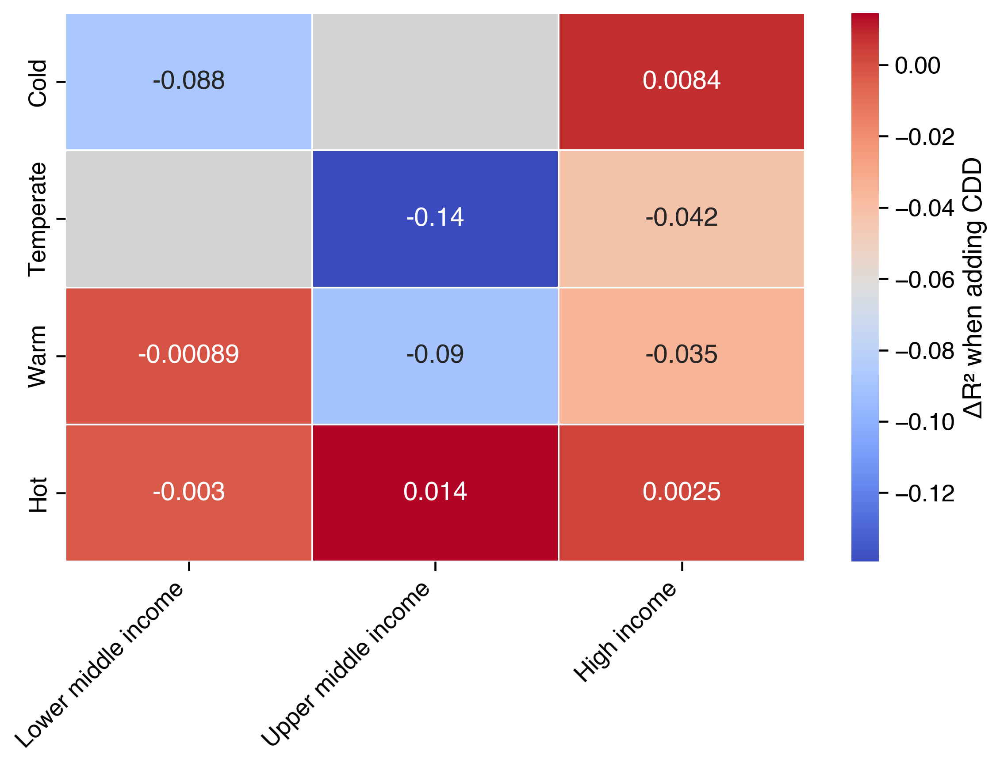

In [23]:
#df = country_metrics_delta.join(dfi

df = country_metrics_delta_eld2[['Country', 'delta_R2', 'avg_temp', 'gdp_capita']]
df = df.merge(dfi[['Country', 'Income group']], on='Country', how='left')

df['temp_class'] = pd.cut(
    df['avg_temp'],
    bins=[-10, 15, 20, 25, 50],
    labels=['Cold', 'Temperate', 'Warm','Hot']
)

income_order = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

df['gdp_class'] = pd.Categorical(
    df['Income group'],
    categories=income_order,
    ordered=True
)

df.groupby(['temp_class','gdp_class'])['delta_R2'].mean()

# Create pivot as before
pivot = df.pivot_table(
    index='temp_class',
    columns='gdp_class',
    values='delta_R2',
    aggfunc='mean'
)

# --- 1. Set NaNs to show as gray ---
cmap = sns.color_palette("coolwarm", as_cmap=True)
cmap.set_bad(color="lightgray")     # color for NaN squares

# --- 2. Make the heatmap ---
plt.figure(figsize=(8,6))
ax = sns.heatmap(
    pivot,
    annot=True,
    cmap=cmap,
    linewidths=0.5,
    linecolor='white',
    cbar=True
)

# --- 3. Remove axis label strings ---
ax.set_xlabel("")   # removes "gdp_class"
ax.set_ylabel("")   # removes "temp_class"

# --- 4. Colorbar label with delta symbol ---
cbar = ax.collections[0].colorbar
cbar.set_label("ΔR² when adding CDD", fontsize=14)

# Optional: rotate tick labels for readability
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.savefig('/Users/charlottecockburn/Downloads/magnumopus_eld.png')
plt.show()



## Miscellaneous numbers needed!

In [155]:
print('number of countries with data before 2010: ', len(mdf['Country'][mdf['Date'].dt.year<2010].unique()))
print('number of countries with data before 2020: ', len(mdf['Country'][mdf['Date'].dt.year<2020].unique()))
print('number of countries with data before 2020: ', len(mdf['Country'][mdf['Date'].dt.year<2023].unique()))

number of countries with data before 2010:  5
number of countries with data before 2020:  81
number of countries with data before 2020:  85


In [156]:
# Keep only 2020 and 2024
df = mdf[mdf['Year'].isin([2020, 2024])]
# Keep only countries with both years
countries = df.groupby('Country')['Year'].nunique()
df = df[df['Country'].isin(countries[countries == 2].index)]
# Separate 2020 and 2024 data
df_2020 = df[df['Year'] == 2020][['Country', 'demand_kwh_per_capita', 'Population']]
df_2024 = df[df['Year'] == 2024][['Country', 'demand_kwh_per_capita', 'Population']]
# Merge
merged = df_2020.merge(df_2024, on='Country', suffixes=('_2020', '_2024'))
# Compute global population-weighted averages
Epc_2020 = (merged['demand_kwh_per_capita_2020'] * merged['Population_2020']).sum() / merged['Population_2020'].sum()
Epc_2024 = (merged['demand_kwh_per_capita_2024'] * merged['Population_2024']).sum() / merged['Population_2024'].sum()
# Compute % change
global_pct_change = ((Epc_2024 - Epc_2020) / Epc_2020) * 100
print(f"Global per-capita electricity use increased by {global_pct_change:.1f}% from 2020 to 2024.")


Global per-capita electricity use increased by 14.4% from 2020 to 2024.


In [158]:
# POR for each country!
pre_2020 = mdf['Country'][mdf['Date'].dt.year < 2010].unique()
len(pre_2020)

for country in mdf['Country'].unique():
    this_mdf = mdf[mdf['Country'] == country]
    min_year = this_mdf['Date'].dt.year.min()
    max_year = this_mdf['Date'].dt.year.max()
    # print(f'{country} {min_year} {max_year}')

In [159]:
import pandas as pd

# Define canonical warm/cold months for each hemisphere
north_warm = [6, 7, 8, 9]
south_warm = [12, 1, 2, 3]

north_cold = south_warm      # opposite season
south_cold = north_warm

# Ensure month + year columns
mdf['Month'] = mdf['Date'].dt.month
mdf['Year'] = mdf['Date'].dt.year

def weighted_pct_change(df, value_col='demand_kwh_per_capita', pop_col='Population'):
    df = df[df['Year'].isin([2020, 2024])]
    countries = df.groupby('Country')['Year'].nunique()
    df = df[df['Country'].isin(countries[countries == 2].index)]

    df_2020 = df[df['Year'] == 2020][['Country', value_col, pop_col]]
    df_2024 = df[df['Year'] == 2024][['Country', value_col, pop_col]]

    merged = df_2020.merge(df_2024, on='Country', suffixes=('_2020', '_2024'))

    E_2020 = (merged[f'{value_col}_2020'] * merged[f'{pop_col}_2020']).sum() / merged[f'{pop_col}_2020'].sum()
    E_2024 = (merged[f'{value_col}_2024'] * merged[f'{pop_col}_2024']).sum() / merged[f'{pop_col}_2024'].sum()

    return ((E_2024 - E_2020) / E_2020) * 100

dynamic_warm_months = {}

for country, dfc in mdf.groupby('Country'):
    hemisphere = dfc['Hemisphere'].iloc[0]
    canonical_warm = north_warm if hemisphere == 'North' else south_warm

    # Compute long-term monthly average temperature
    month_avg_temp = dfc.groupby('Month')['avg_temp'].mean()

    # Include canonical warm season OR months > 19°C
    include = month_avg_temp.index[
        (month_avg_temp > 19) |
        (month_avg_temp.index.isin(canonical_warm))
    ]

    dynamic_warm_months[country] = set(include)

summer_df = mdf[
    mdf.apply(lambda row: row['Month'] in dynamic_warm_months[row['Country']], axis=1)
]

summer_change = weighted_pct_change(summer_df)

winter_df = mdf[
    ~mdf.apply(lambda row: row['Month'] in dynamic_warm_months[row['Country']], axis=1)
]

winter_change = weighted_pct_change(winter_df)


print(f"Dynamic warm-season per-capita electricity change (2020→2024): {summer_change:.1f}%")
print(f"Dynamic cool-season per-capita electricity change (2020→2024): {winter_change:.1f}%")


Dynamic warm-season per-capita electricity change (2020→2024): 17.2%
Dynamic cool-season per-capita electricity change (2020→2024): 14.0%


/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_10443/198255968.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mdf['Month'] = mdf['Date'].dt.month
/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_10443/198255968.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mdf['Year'] = mdf['Date'].dt.year


In [169]:
# Now get % change in low, middle, and high-income countries 

import pandas as pd

#mdf_merged = mdf.merge(dfi[['Country', 'Income group']], on='Country', how='left')

df = mdf[mdf['Year'].isin([2020, 2024])]
countries = df.groupby('Country')['Year'].nunique()
df = df[df['Country'].isin(countries[countries == 2].index)]

results = []

for group, gdf in df.groupby('Income group'):
    g2020 = gdf[gdf['Year'] == 2020]
    g2024 = gdf[gdf['Year'] == 2024]

    merged = g2020.merge(
        g2024,
        on='Country',
        suffixes=('_2020', '_2024')
    )

    if len(merged) == 0:
        continue  # skip groups with no overlap

    E2020 = (merged['demand_kwh_per_capita_2020'] * merged['Population_2020']).sum() / merged['Population_2020'].sum()
    E2024 = (merged['demand_kwh_per_capita_2024'] * merged['Population_2024']).sum() / merged['Population_2024'].sum()

    pct_change = ((E2024 - E2020) / E2020) * 100
    results.append({'Income group': group, 'pct_change_per_capita': pct_change})

change_by_income = pd.DataFrame(results).sort_values('Income group')

print(change_by_income)


          Income group  pct_change_per_capita
0          High income               4.234556
1  Lower middle income              23.196616
2  Upper middle income              25.321591


In [171]:
# Filter to 2024
df_2024 = mdf[mdf['Year'] == 2024]

# Compute stats for each income group
results = []

for group, gdf in df_2024.groupby('Income group'):
    E_pc_weighted = (gdf['demand_kwh_per_capita'] * gdf['Population']).sum() / gdf['Population'].sum()
    E_min = gdf['demand_kwh_per_capita'].min()
    E_max = gdf['demand_kwh_per_capita'].max()
    results.append({
        'Income group': group,
        'E_pc_2024_weighted': E_pc_weighted,
        'E_pc_min': E_min,
        'E_pc_max': E_max
    })

result_df = pd.DataFrame(results).sort_values('Income group')
print(result_df)


          Income group  E_pc_2024_weighted  E_pc_min  E_pc_max
0          High income          716.002033    198.83   2675.44
1  Lower middle income           92.190063      9.84    283.10
2  Upper middle income          459.687524     97.82    679.85


In [172]:
print('Countries with r^2 > 0.6: ',len(df_all[df_all['BestR2']>0.6]))
print('Countries with r^2 < 0.3: ',len(df_all[df_all['BestR2']<=0.3]))

Countries with r^2 > 0.6:  15
Countries with r^2 < 0.3:  57


In [175]:

print('Countries below 0:', len(country_metrics_delta[country_metrics_delta['avg_R2_cdd']<=0]))


cm_pos = country_metrics_delta[country_metrics_delta['avg_R2_cdd']>=0.3]

print('Countries above 0.3:', len(country_metrics_delta[country_metrics_delta['avg_R2_cdd']>=0.3]))
print('Countries above 0:', len(cm_pos))

print('Countries above 0.3 and did worse with CDD:', len(cm_pos[cm_pos['delta_R2']<=0]))

print('Countries above 0.3 and did better with CDD, but not significant:', len(cm_pos[(cm_pos['delta_R2']>0) & (cm_pos['pval_delta_r2']>=0.05)]))
print('Countries above 0.3 and did better with CDD, and significant:', len(cm_pos[(cm_pos['delta_R2']>0) & (cm_pos['pval_delta_r2']<0.05)]))
print('improved by an average of:', (cm_pos['delta_R2'][(cm_pos['delta_R2']>0) & (cm_pos['pval_delta_r2']<0.05)]).mean())



Countries below 0: 22
Countries above 0.3: 53
Countries above 0: 53
Countries above 0.3 and did worse with CDD: 8
Countries above 0.3 and did better with CDD, but not significant: 2
Countries above 0.3 and did better with CDD, and significant: 43
improved by an average of: 0.6277202760763002


In [176]:
cm_pos[['Country', 'delta_nRMSE', 'avg_temp']].sort_values('delta_nRMSE')
cm_pos['avg_temp'][cm_pos['delta_nRMSE']>-0.02].mean()
cm_pos['avg_temp'][cm_pos['delta_nRMSE']<=-0.02].mean()


24.3829511387839

In [178]:
print('Countries below 0:', len(country_metrics_delta_eld2[country_metrics_delta_eld2['avg_R2_eld']<=0]))


cm_pos = country_metrics_delta_eld2[country_metrics_delta_eld2['avg_R2_eld']>=0.3]

print('Countries above 0.3:', len(country_metrics_delta_eld2[country_metrics_delta_eld2['avg_R2_eld']>=0.3]))
print('Countries above 0:', len(cm_pos))

print('Countries above 0.3 and did worse with ELD:', len(cm_pos[cm_pos['delta_R2']<=0]))

print('Countries above 0.3 and did better with ELD, but not significant:', len(cm_pos[(cm_pos['delta_R2']>0) & (cm_pos['pval_delta_r2']>=0.05)]))
print('Countries above 0.3 and did better with ELD, and significant:', len(cm_pos[(cm_pos['delta_R2']>0) & (cm_pos['pval_delta_r2']<0.05)]))
print('improved by an average of:', (cm_pos['delta_R2'][(cm_pos['delta_R2']>0) & (cm_pos['pval_delta_r2']<0.05)]).mean())



Countries below 0: 21
Countries above 0.3: 52
Countries above 0: 52
Countries above 0.3 and did worse with ELD: 26
Countries above 0.3 and did better with ELD, but not significant: 6
Countries above 0.3 and did better with ELD, and significant: 20
improved by an average of: 0.035959696791151206


In [179]:
inclev = mdf.merge(dfi[['Country', 'Income group']], how = 'left')
print(len(inclev['Country'][inclev['Income group'] == 'Lower middle income'].unique()))
print(len(inclev['Country'][inclev['Income group'] == 'Upper middle income'].unique()))
print(len(inclev['Country'][inclev['Income group'] == 'High income'].unique()))

15
27
43


In [195]:
country_metrics2 = country_metrics.merge(country_perm_importance[['Country', 'top_variable']], on = 'Country')
country_metrics2['avg_RMSE_ratio'] = country_metrics2['avg_RMSE_ratio'] * 100
country_metrics2 = country_metrics2.merge(country_metrics_delta[['Country','delta_R2', 'pval_delta_r2', 'delta_nRMSE', 'pval_delta_nrmse']], on = 'Country')
country_metrics2 = country_metrics2.rename(columns={'delta_R2': 'dR2_CDD', 'pval_delta_r2' : 'pR2_CDD',
                                                   'delta_nRMSE':'dRMSE_CDD', 'pval_delta_nrmse': 'pRMSE_CDD'})
country_metrics2 = country_metrics2.merge(country_metrics_delta_eld[['Country','delta_R2', 'pval_delta_r2']], on = 'Country')
country_metrics2 = country_metrics2.rename(columns={'delta_R2': 'dR2_ELD', 'pval_delta_r2' : 'pR2_ELD'})
country_metrics2 = country_metrics2.merge(country_metrics_delta_eld2[['Country','delta_R2', 'pval_delta_r2']], on = 'Country')
country_metrics2 = country_metrics2.rename(columns={'delta_R2': 'dR2_ELD2', 'pval_delta_r2' : 'pR2_ELD2'})
country_metrics2 = country_metrics2.merge(dfi[['Country','Income group']], on = 'Country')



,Country,avg_R2,avg_RMSE_ratio,top_variable,dR2_CDD,pR2_CDD,dRMSE_CDD,pRMSE_CDD,dR2_ELD,pR2_ELD,dR2_ELD2,pR2_ELD2,Income group
0,Kuwait,0.974453,3.623746,cdd_sum_sum,1.116158,6.694182e-60,-0.213605,8.766068e-77,0.240437,3.238494e-17,0.004850,1.231701e-09,High income
1,Colombia,0.965101,3.547569,Population,0.001471,1.028539e-10,-0.000738,6.847214e-11,0.005419,1.826722e-25,0.003698,8.662222e-21,Upper middle income
2,Mongolia,0.943607,9.533071,Population,0.003171,2.254687e-06,-0.002743,1.040634e-06,-0.000414,8.865437e-03,-0.000759,1.659313e-03,Upper middle income
3,Cyprus,0.929960,3.895241,cdd_sum_sum,1.109730,1.431891e-58,-0.123663,1.516578e-80,1.031504,8.599762e-60,0.009894,1.849115e-09,High income
4,China,0.920145,4.686796,GDP,0.132155,2.072055e-14,-0.024020,5.946602e-29,0.176871,4.506547e-15,0.042110,2.652445e-09,Upper middle income
...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,Armenia,-0.990313,10.353739,cdd_sum_sum,-0.024344,8.938842e-01,-0.008083,1.649221e-04,-0.108218,1.973844e-01,-0.191306,1.526101e-05,Upper middle income
81,Moldova,-1.020348,4.918298,Population,0.642117,4.898164e-03,-0.013725,7.153934e-14,-0.150360,4.992391e-01,-0.075788,4.435626e-01,Upper middle income
82,Belarus,-1.266863,5.310060,Population,-0.062759,7.927701e-01,-0.002223,3.914337e-02,0.537677,2.323459e-03,0.385126,1.892336e-02,Upper middle income
83,Kyrgyzstan,-1.391235,38.986059,avg_ELD,-0.182108,3.251874e-04,0.016355,2.232034e-05,-0.025749,7.703433e-01,-0.350457,6.002481e-03,Lower middle income


In [213]:
#CREATING BIG DATA EXPOR!

country_metrics2 = country_metrics.merge(country_perm_importance[['Country', 'top_variable']], on = 'Country')
country_metrics2['avg_RMSE_ratio'] = country_metrics2['avg_RMSE_ratio'] * 100
country_metrics2 = country_metrics2.merge(country_metrics_delta[['Country','delta_R2', 'pval_delta_r2', 'delta_nRMSE', 'pval_delta_nrmse']], on = 'Country')
country_metrics2 = country_metrics2.rename(columns={'delta_R2': 'dR2_CDD', 'pval_delta_r2' : 'pR2_CDD',
                                                   'delta_nRMSE':'dRMSE_CDD', 'pval_delta_nrmse': 'pRMSE_CDD'})
country_metrics2 = country_metrics2.merge(country_metrics_delta_eld[['Country','delta_R2', 'pval_delta_r2']], on = 'Country')
country_metrics2 = country_metrics2.rename(columns={'delta_R2': 'dR2_ELD', 'pval_delta_r2' : 'pR2_ELD'})
country_metrics2 = country_metrics2.merge(country_metrics_delta_eld2[['Country','delta_R2', 'pval_delta_r2']], on = 'Country')
country_metrics2 = country_metrics2.rename(columns={'delta_R2': 'dR2_ELD2', 'pval_delta_r2' : 'pR2_ELD2'})
country_metrics2 = country_metrics2.merge(dfi[['Country','Income group']], on = 'Country')


# 1. Recreate the classification dataframe
df_class = country_metrics_delta[['Country', 'avg_temp']].merge(
    dfi[['Country', 'Income group']], on='Country', how='left'
)

# Temperature classification
df_class['temp_class'] = pd.cut(
    df_class['avg_temp'],
    bins=[-10, 15, 20, 25, 50],
    labels=['Cold', 'Temperate', 'Warm', 'Hot']
)


# 2. Merge into country_metrics2
country_metrics2 = country_metrics2.merge(
    df_class[['Country', 'temp_class']], on='Country', how='left'
)

# ---- 2. Replace top predictor names ----
country_metrics2['top_variable'] = country_metrics2['top_variable'].replace({'cdd_sum_sum': 'CDD'})

# ---- 3. Round numeric columns to 2 significant figures ----
num_cols = ['avg_R2', 'avg_RMSE_ratio', 'dR2_CDD', 'dR2_ELD', 'dR2_ELD2']
for col in num_cols:
    country_metrics2[col] = country_metrics2[col].apply(
        lambda x: np.format_float_positional(x, precision=2, unique=False, fractional=False, trim='k')
    )

# ---- 4. Add asterisks for non-significant deltas ----
alpha = 0.05
for delta_col, p_col in [
    ('dR2_CDD', 'pR2_CDD'),
    ('dRMSE_CDD', 'pRMSE_CDD'),
    ('dR2_ELD', 'pR2_ELD'),
    ('dR2_ELD2', 'pR2_ELD2')
]:
    country_metrics2[delta_col] = country_metrics2.apply(
        lambda row: f"{row[delta_col]}*" if row[p_col] >= alpha else row[delta_col],
        axis=1
    )

#get percent RMSE and round off
country_metrics2['dRMSE_CDD'] = pd.to_numeric(country_metrics2['dRMSE_CDD'], errors='coerce')
country_metrics2['dRMSE_CDD'] = (country_metrics2['dRMSE_CDD'] * 100).round(2)




# ---- 5. Drop p-value columns if only showing asterisks ----
country_metrics2 = country_metrics2.drop(columns=['pR2_CDD', 'pRMSE_CDD', 'pR2_ELD','pR2_ELD2'])

# ---- 6. Save to CSV ----
country_metrics2.to_csv("/Users/charlottecockburn/Downloads/country_metrics_summary.csv", index=False)
print("donezo!")

### Figures for AMS

/var/folders/tq/cpsvlnkd7ygf5bm34pq6x9f40000gn/T/ipykernel_59126/2747686206.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mdf['Year'] = mdf['Date'].dt.year


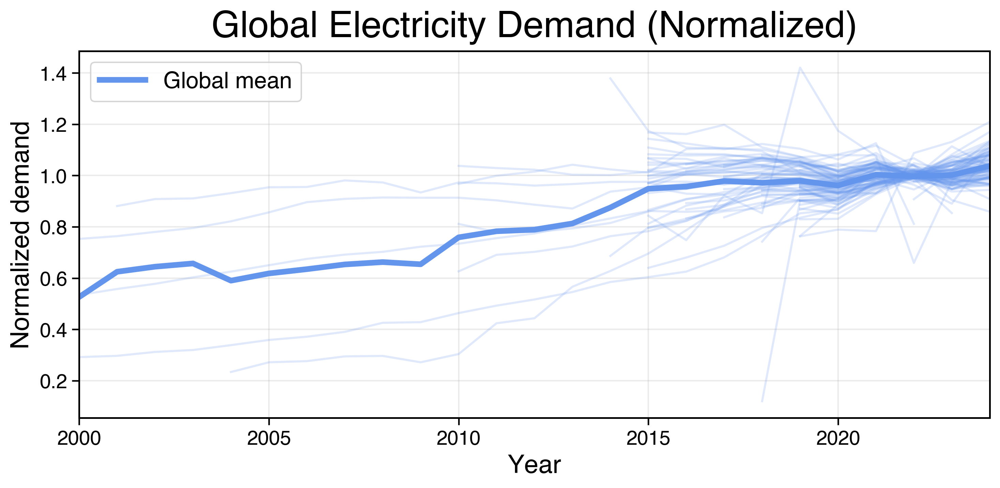

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# ---- Precompute annual means ---- #
mdf['Year'] = mdf['Date'].dt.year

annual = mdf.groupby(['Country', 'Year'])['demand_gwh'].mean().reset_index()

# ---- Compute 2020–2024 baseline for each country ---- #
baseline = annual[(annual['Year'] >= 2020) & (annual['Year'] <= 2024)] \
    .groupby('Country')['demand_gwh'].mean().rename('baseline_mean')

annual = annual.merge(baseline, on='Country', how='left')

annual['baseline_mean'] = annual['baseline_mean'].fillna(
    annual.groupby('Country')['demand_gwh'].transform('mean')
)

annual['norm_demand'] = annual['demand_gwh'] / annual['baseline_mean']

# ---- Global mean + coverage ---- #
global_mean = annual.groupby('Year')['norm_demand'].mean().reset_index()
coverage = annual.groupby('Year')['Country'].nunique().reset_index(name='n_countries')

# ---- Figure ---- #
fig, ax = plt.subplots(figsize=(10, 5))

for country in annual['Country'].unique():
    cdf = annual[annual['Country'] == country]
    ax.plot(cdf['Year'], cdf['norm_demand'], color='cornflowerblue', lw=1.5, alpha=0.2)

ax.plot(global_mean['Year'], global_mean['norm_demand'], color='cornflowerblue', lw=4, label='Global mean')

ax.set_title("Global Electricity Demand (Normalized)", fontsize=26, pad=10)
ax.set_xlabel("Year", fontsize=18)
ax.set_ylabel("Normalized demand", fontsize=18)
ax.tick_params(axis='both', labelsize=14)
ax.grid(True, alpha=0.25)
ax.legend(fontsize=16, frameon=True)
ax.set_xlim([2000, 2024])

fig.tight_layout()
plt.savefig("/Users/charlottecockburn/Downloads/global_demand_index.png", bbox_inches='tight')
plt.show()


In [18]:
# Balance temps: build up figure 

#Iteration 1: No line!

def plotting1(country_name):
    # Filter data
    df = mdf[mdf['Country'] == country_name].copy()
    x = df['avg_temp'].values.reshape(-1, 1)
    y = df['demand_gwh'].values

    # ---- Heating threshold search ----
    Tb_heat_candidates = np.linspace(5, 15, 21)
    best_r2_heat, best_Tb_heat, best_model_heat = -np.inf, None, None
    
    for tbh in Tb_heat_candidates:
        mask = x.flatten() <= tbh
        x_sub, y_sub = x[mask], y[mask]
        if len(x_sub) < 2:
            continue
        model = LinearRegression().fit(x_sub, y_sub)
        r2 = r2_score(y_sub, model.predict(x_sub))
        if r2 > best_r2_heat:
            best_r2_heat, best_Tb_heat, best_model_heat = r2, tbh, model

    # ---- Cooling threshold search ----
    Tb_cool_candidates = np.linspace(16, 26, 21)
    best_r2_cool, best_Tb_cool, best_model_cool = -np.inf, None, None
    
    for tbc in Tb_cool_candidates:
        mask = x.flatten() >= tbc
        x_sub, y_sub = x[mask], y[mask]
        if len(x_sub) < 2:
            continue
        model = LinearRegression().fit(x_sub, y_sub)
        r2 = r2_score(y_sub, model.predict(x_sub))
        if r2 > best_r2_cool:
            best_r2_cool, best_Tb_cool, best_model_cool = r2, tbc, model

    # ---- Plot figure ----
    fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

    # Force identical scaling so spacing doesn't wiggle
    ax.set_xlim(df['avg_temp'].min(), df['avg_temp'].max())
    ax.set_ylim(df['demand_gwh'].min(), df['demand_gwh'].max())


    # Scatter
    ax.scatter(x, y, color="lightgray", alpha=0.6, label="Observed demand")

    # # Heating line
    # if best_Tb_heat:
    #     x_heat = np.linspace(min(x), best_Tb_heat, 100).reshape(-1, 1)
    #     y_heat = best_model_heat.predict(x_heat)
    #     ax.plot(x_heat, y_heat, color='red', linewidth=2)
    #     ax.axvline(best_Tb_heat, color='red', linestyle='--', linewidth=2, alpha=0.8)

    # # Cooling line
    # if best_Tb_cool:
    #     x_cool = np.linspace(best_Tb_cool, max(x), 100).reshape(-1, 1)
    #     y_cool = best_model_cool.predict(x_cool)
    #     ax.plot(x_cool, y_cool, color='blue', linewidth=2)
    #     ax.axvline(best_Tb_cool, color='blue', linestyle='--', linewidth=2, alpha=0.8)

    # Labels + title
    ax.set_xlabel("Monthly average temperature [°C]", fontsize=26, labelpad=10)
    ax.set_ylabel("Electricity demand [GWh]", fontsize=26, labelpad=10)
    ax.set_title(country_name, fontsize=28, pad=15)

    ax.grid(True)

    # ---- LEGEND (custom handles so dashed lines appear dashed) ----
    # if (best_Tb_cool and best_Tb_heat):
    #     legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand"),
    #         Line2D([], [], color='red', linestyle='--', linewidth=2,label=f"Heating threshold ({best_Tb_heat:.1f}°C)"),
    #         Line2D([], [], color='blue', linestyle='--', linewidth=2,label=f"Cooling threshold ({best_Tb_cool:.1f}°C)")
    #     ]
    # elif best_Tb_cool: 
    #     legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand"),
    #         Line2D([], [], color='blue', linestyle='--', linewidth=2,label=f"Cooling threshold ({best_Tb_cool:.1f}°C)")
    #     ]
    # elif best_Tb_heat: 
    #     legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand"),
    #         Line2D([], [], color='red', linestyle='--', linewidth=2,label=f"Heating threshold ({best_Tb_heat:.1f}°C)"),
    #     ]
    
    legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand")]
        
        
    ax.legend(handles=legend_handles, fontsize=14)

    # Save
    fig.savefig(f"/Users/charlottecockburn/Downloads/{country_name}_balancetemps1.png",
                bbox_inches="tight")
    plt.show()

plotting1('United States of America')

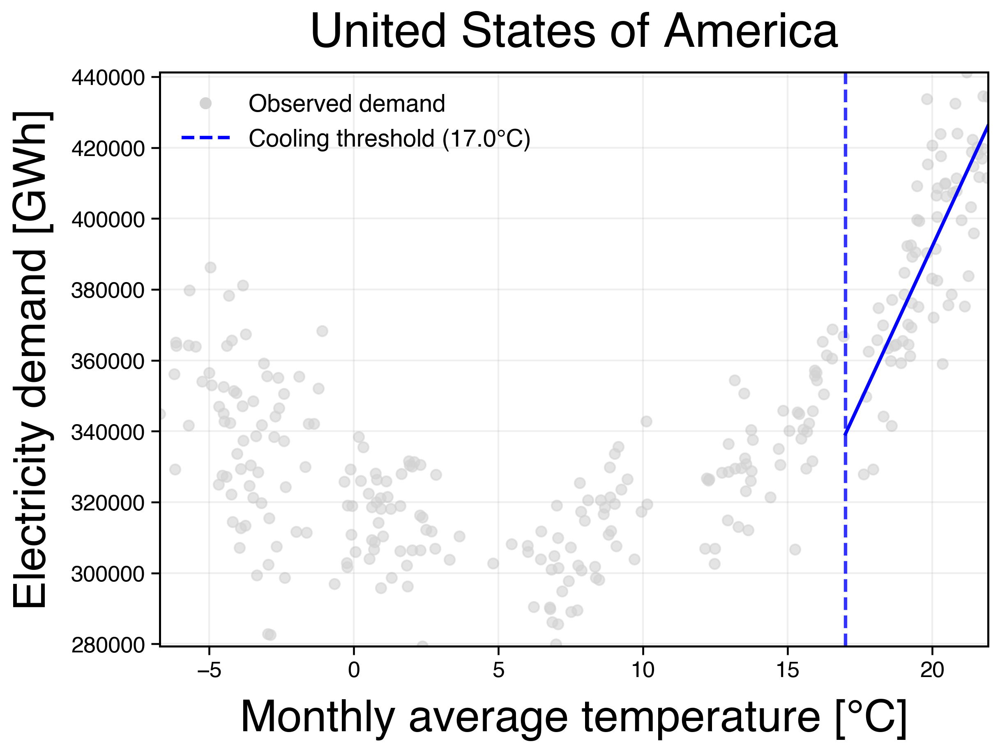

In [21]:
# Balance temps: build up figure 

#Iteration 1: No line!

def plotting1(country_name):
    # Filter data
    df = mdf[mdf['Country'] == country_name].copy()
    x = df['avg_temp'].values.reshape(-1, 1)
    y = df['demand_gwh'].values

    # ---- Heating threshold search ----
    Tb_heat_candidates = np.linspace(5, 15, 21)
    best_r2_heat, best_Tb_heat, best_model_heat = -np.inf, None, None
    
    # for tbh in Tb_heat_candidates:
    #     mask = x.flatten() <= tbh
    #     x_sub, y_sub = x[mask], y[mask]
    #     if len(x_sub) < 2:
    #         continue
    #     model = LinearRegression().fit(x_sub, y_sub)
    #     r2 = r2_score(y_sub, model.predict(x_sub))
    #     if r2 > best_r2_heat:
    #         best_r2_heat, best_Tb_heat, best_model_heat = r2, tbh, model

    # ---- Cooling threshold search ----
    Tb_cool_candidates = np.linspace(16, 26, 21)
    best_r2_cool, best_Tb_cool, best_model_cool = -np.inf, None, None
    
    for tbc in Tb_cool_candidates:
        mask = x.flatten() >= tbc
        x_sub, y_sub = x[mask], y[mask]
        if len(x_sub) < 2:
            continue
        model = LinearRegression().fit(x_sub, y_sub)
        r2 = r2_score(y_sub, model.predict(x_sub))
        if r2 > best_r2_cool:
            best_r2_cool, best_Tb_cool, best_model_cool = r2, tbc, model

    # ---- Plot figure ----
    fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)

    # Force identical scaling so spacing doesn't wiggle
    ax.set_xlim(df['avg_temp'].min(), df['avg_temp'].max())
    ax.set_ylim(df['demand_gwh'].min(), df['demand_gwh'].max())


    # Scatter
    ax.scatter(x, y, color="lightgray", alpha=0.6, label="Observed demand")

    # # Heating line
    # if best_Tb_heat:
    #     x_heat = np.linspace(min(x), best_Tb_heat, 100).reshape(-1, 1)
    #     y_heat = best_model_heat.predict(x_heat)
    #     ax.plot(x_heat, y_heat, color='red', linewidth=2)
    #     ax.axvline(best_Tb_heat, color='red', linestyle='--', linewidth=2, alpha=0.8)

    # Cooling line
    if best_Tb_cool:
        x_cool = np.linspace(best_Tb_cool, max(x), 100).reshape(-1, 1)
        y_cool = best_model_cool.predict(x_cool)
        ax.plot(x_cool, y_cool, color='blue', linewidth=2)
        ax.axvline(best_Tb_cool, color='blue', linestyle='--', linewidth=2, alpha=0.8)

    # Labels + title
    ax.set_xlabel("Monthly average temperature [°C]", fontsize=26, labelpad=10)
    ax.set_ylabel("Electricity demand [GWh]", fontsize=26, labelpad=10)
    ax.set_title(country_name, fontsize=28, pad=15)

    ax.grid(True)

#    ---- LEGEND (custom handles so dashed lines appear dashed) ----
    if (best_Tb_cool and best_Tb_heat):
        legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand"),
            Line2D([], [], color='red', linestyle='--', linewidth=2,label=f"Heating threshold ({best_Tb_heat:.1f}°C)"),
            Line2D([], [], color='blue', linestyle='--', linewidth=2,label=f"Cooling threshold ({best_Tb_cool:.1f}°C)")
        ]
    elif best_Tb_cool: 
        legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand"),
            Line2D([], [], color='blue', linestyle='--', linewidth=2,label=f"Cooling threshold ({best_Tb_cool:.1f}°C)")
        ]
    elif best_Tb_heat: 
        legend_handles = [Line2D([], [], color='lightgray', marker='o', linestyle='None', label="Observed demand"),
            Line2D([], [], color='red', linestyle='--', linewidth=2,label=f"Heating threshold ({best_Tb_heat:.1f}°C)"),
        ]
    
        
        
    ax.legend(handles=legend_handles, fontsize=14)

    # Save
    fig.savefig(f"/Users/charlottecockburn/Downloads/{country_name}_balancetemps1.png",
                bbox_inches="tight")
    plt.show()

plotting1('United States of America')